In [1]:
import os
os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/script/spatialID-main/")
import time
from scipy.sparse import *
import random
import argparse
import anndata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torch import nn
import torch
import torch_geometric
from cell_type_annotation_model import DNNModel, SpatialModelTrainer
import torch.utils.data as Data
import scanpy as sc
from anndata import AnnData
import scipy.sparse as sp

In [2]:
import os
os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
anodf = sc.read("ref/cross_region/T47.h5ad")
anodf
adata.obs.to_csv('ref/cross_region/T47.hp.csv', index=False)

AnnData object with n_obs × n_vars = 28721 × 15780
    obs: 'region', 'cellID', 'x', 'y', 'cellType'
    var: 'genenames'
    obsm: 'spatial'

In [3]:
anodf.obs['cellID']

1            17
2            88
3            97
4           122
5           124
          ...  
34415    671618
34416    671630
34417    671631
34418    671633
34419    671648
Name: cellID, Length: 28721, dtype: int64

In [2]:
#coustruct stereoseq matrix
os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
# 假设你的数据已经在一个名为 df 的 DataFrame 中，列名为 ['gene_id', 'cell_label', 'count', 'x', 'y']

def MakeSpAnndata(df):
    # 1. 创建细胞 x 基因的计数矩阵 (X)
    # 使用数据透视表将长格式数据转换为宽格式矩阵
    count_matrix = df.pivot_table(
        index='cell_label',  # 细胞标签作为行索引
        columns='gene_id',   # 基因ID作为列索引
        values='count',      # 值是计数
        fill_value=0,        # 没有记录的位置填充为0
        aggfunc='sum'        # 如果存在重复的 (cell_label, gene_id) 对，则对计数求和
    )
    
    # 将透视表得到的 DataFrame 转换为稀疏矩阵以节省内存
    X = sp.csr_matrix(count_matrix.values)
    
    # 2. 准备观测信息 (obs) 和变量信息 (var)
    # obs_metadata 包含细胞的元数据。这里我们从 count_matrix 的索引获取细胞标签，并提取每个细胞唯一的空间坐标。
    # 注意：确保每个 cell_label 只对应一组 (x, y) 坐标
    obs_metadata = pd.DataFrame(index=count_matrix.index.astype(str)) # 索引设置为细胞标签，并转为字符串
    # 获取每个细胞对应的唯一坐标（假设每个cell_label对应唯一的x,y）
    unique_coords = df.groupby('cell_label')[['x', 'y']].first()
    obs_metadata['x_original'] = unique_coords['x'] # 可选：将原始坐标也存入obs
    obs_metadata['y_original'] = unique_coords['y']
    
    # var_metadata 包含基因的元数据。索引是基因名。
    var_metadata = pd.DataFrame(index=count_matrix.columns.astype(str)) # 索引设置为基因ID
    
    # 3. 创建 AnnData 对象
    adata = AnnData(
        X=X,                 # 细胞 x 基因的计数矩阵
        obs=obs_metadata,    # 细胞观测元信息
        var=var_metadata,    # 基因变量元信息
        dtype=X.dtype        # 数据类型与计数矩阵一致
    )
    
    # 4. 添加空间坐标到 obsm
    # 从唯一坐标中获取坐标数组，顺序与 count_matrix.index (即 adata.obs_names) 一致
    spatial_coords = unique_coords.loc[count_matrix.index].values # 确保坐标顺序与矩阵行顺序一致
    adata.obsm['spatial'] = spatial_coords # 空间坐标存储在 obsm['spatial'] 中
    
    # 5. (可选) 添加图像和缩放因子信息到 uns
    # 如果你的数据来自10x Visium等，并且有组织图像和缩放因子，可以按如下方式添加：
    library_id = "your_tissue_section_id" # 例如 "section1"
    adata.uns['spatial'] = {
        library_id: {
            'images': {
                #'hires': np.array(...),  # 这里应该是实际的组织图像数组 (H, W, 3 或 4)
                #'lowres': np.array(...), # 低分辨率图像 (可选)
            },
            'scalefactors': {
                #'tissue_hires_scalef': 1.0,  # 空间坐标与高清图像像素的比例因子
                #'tissue_lowres_scalef': 1.0, # 空间坐标与低分辨率图像像素的比例因子 (可选)
                #'spot_diameter_fullres': 89.0, # 捕获点（spot）的直径
            },
            #'metadata': { ... } # 其他元数据 (可选)
        }
    }
    return adata


In [33]:
df = pd.read_csv("data/cross_region/cellan_Hippo_T47.csv", sep=",")  
df['count'] = df['umi_count']
df['gene_id'] = df['gene']
adata = MakeSpAnndata(df)
print("Cell names:", adata.obs_names[:5])
print("Gene names:", adata.var_names[:5])

# 7. 验证 AnnData 对象
print(adata)
adata.write_h5ad('../downstream_analysis/data/cross_region/Macaque.mystereo.hippoT47.h5ad')

Cell names: Index(['67', '127', '181', '226', '248'], dtype='object', name='cell_label')
Gene names: Index(['A2M', 'A2ML1', 'AAAS', 'AACS', 'AADAC'], dtype='object', name='gene_id')
AnnData object with n_obs × n_vars = 9326 × 14767
    obs: 'x_original', 'y_original'
    uns: 'spatial'
    obsm: 'spatial'


## Spatialid

In [2]:
def dnn_train(adata, labels, hidden_dim, train_percent, epoches, batch_size, learning_rate, model_save_path):
    #### labels_transform
    def labels_transform(raw_labels):
        raw_labels_copy = raw_labels.copy()
        labels_categroies = [i for i in set(raw_labels)]
        length = len(labels_categroies)
        re_dic = {}
        for i in range(length):
            raw_labels_copy.replace(labels_categroies[i],i, inplace = True)
            re_dic[i] = labels_categroies[i]
        return [i for i in raw_labels_copy],re_dic
    
    ### save models
    def save_model(n):
        print('\n==> save model...{}'.format(n))
        torch.save({
            'model':DnnModel,
            'label_names': [lable_dic[i] for i in lable_dic],
            'marker_genes':gene_names,
        }, model_save_path+ '_'+ str(n) +'.dnnmodel')
    
    
    ###preprocess
    print('\n==> Preprocessing...')
    adata_x = adata.X.todense()
    raw_labels = adata.obs[labels]
    gene_names = [i for i in adata.var_names]
    labels, lable_dic = labels_transform(raw_labels)
    inputs, outputs = torch.from_numpy(np.array(adata_x)).to(torch.float32), torch.from_numpy(np.array(labels))

    ###dataloader
    print('\n==> Predataloader...')
    dataset = Data.TensorDataset(inputs, outputs)
    tran_legth, test_length = int(len(dataset)*train_percent), len(dataset) - int(len(dataset)*train_percent)
    train_set, test_set = Data.random_split(dataset, [tran_legth, test_length])
    train_loader = Data.DataLoader(train_set, 
                                   batch_size=batch_size, 
                                   shuffle=True,)
    
    test_loader = Data.DataLoader(test_set, 
                                  batch_size=batch_size, 
                                  shuffle=False)
    
    #####
    print('\n==> DnnModel...')
    input_dim = inputs.shape[1]
    hidden_dim = hidden_dim
    output_dim = len(set(labels))
    learning_rate = learning_rate
    
    DnnModel = DNNModel(input_dim = input_dim, 
                    hidden_dim = hidden_dim, 
                    output_dim = output_dim,
                    drop_rate=0.2
                       )
    ###train
    print('\n==> train...')
    counts = 0
    max_acc = 0
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(DnnModel.parameters(), lr = learning_rate)
    for epoch in range(epoches):
        for input_tensor,transformed_labels in train_loader:
            out = DnnModel(input_tensor)
            loss = criterion(out, transformed_labels)
            optimizer.zero_grad() 
            loss.backward()
            optimizer.step()
        
        correct = 0
        total = 0
        with torch.no_grad(): 
            for input_tensor,transformed_labels in test_loader:
                pred = DnnModel(input_tensor).argmax(1)
                
                correct += (pred == transformed_labels).sum().item()
                total += transformed_labels.size(0)
        acc = correct / total
        print('[epoch {}], loss: {}, acc：{}'.format(epoch + 1, loss.data, correct / total))
        
        if(acc > max_acc):
            max_acc = acc
            save_model(counts)
            counts += 1
    
    save_model(counts)


def transfer(adata, model, transfer_batchsize, result_csv, new_adata, device,k_graph,params):
    # Load DNN model trained by sc-dataset.
    checkpoint = torch.load(model)
    dnn_model = checkpoint['model'].to(device)
    # Initialize DNN input.
    marker_genes = checkpoint['marker_genes']
    gene_indices = adata.var_names.get_indexer(marker_genes)
    adata_X = np.pad(adata.X.todense(), ((0,0),(0,1)))[:, gene_indices]
    norm_factor = np.linalg.norm(adata_X, axis=1, keepdims=True)
    norm_factor[norm_factor == 0] = 1
    dnn_inputs = torch.Tensor(adata_X / norm_factor).split(transfer_batchsize)
    
    # Inference with DNN model.
    dnn_predictions = []
    with torch.no_grad():
        for batch_idx, inputs in enumerate(dnn_inputs):
            inputs = inputs.to(device)
            outputs = dnn_model(inputs)
            dnn_predictions.append(outputs.detach().cpu().numpy())
    label_names = checkpoint['label_names']
    adata.obsm['pseudo_label'] = np.concatenate(dnn_predictions)
    adata.obs['pseudo_class'] = pd.Categorical([label_names[i] for i in adata.obsm['pseudo_label'].argmax(1)])
    adata.uns['pseudo_classes'] = label_names
    print(set(adata.obs['pseudo_class']))
    # Construct spatial graph.
    gene_mat = torch.Tensor(adata_X)
    cell_coo = torch.Tensor(adata.obsm['spatial'])
    data = torch_geometric.data.Data(x = gene_mat, pos = cell_coo)
    data = torch_geometric.transforms.KNNGraph(k = k_graph, loop=True)(data)
    data.y = torch.Tensor(adata.obsm['pseudo_label'])
    # Make distances as edge weights.
    data = torch_geometric.transforms.Distance()(data)
    data.edge_weight = 1 - data.edge_attr[:,0]
    
    # Train self-supervision model.
    params = params
    input_dim = data.num_features
    num_classes = len(adata.uns['pseudo_classes'])
    trainer = SpatialModelTrainer(input_dim, 
                                  num_classes, 
                                  device, 
                                  params = params)
    trainer.train(data, params)
    # trainer.save_checkpoint()
    
    # Inference.
    print('\n==> Inferencing...')
    predictions = trainer.valid(data)
    celltype_pred = pd.Categorical([adata.uns['pseudo_classes'][i] for i in predictions])
    result = pd.DataFrame({'cell': adata.obs_names.tolist(), 'celltype_pred': celltype_pred})
    result.to_csv(result_csv, index=False)
    adata.obsm['celltype_prob'] = predictions
    adata.obs['celltype_pred'] = pd.Categorical(celltype_pred)
    adata.write(new_adata)    
    sc.pl.spatial(adata, img_key=None, color=['celltype_pred'], palette  =  'gnuplot2', spot_size=30, show=True)


### Cb

In [ ]:
df = pd.read_csv("data/cross_region/total_genecount_df_cerebellum.csv", sep=",")  # 如果你是从文件读取
# 注意：图像数组需要实际读取，这里只是示意结构。如果没有图像，可以省略或保留空字典。
adata = MakeSpAnndata(df)
# 6. (可选) 设置基因和细胞名称
# 通常在创建 AnnData 时通过 obs 和 var 的索引自动设置，但你可以检查或重命名：
print("Cell names:", adata.obs_names[:5])
print("Gene names:", adata.var_names[:5])

# 7. 验证 AnnData 对象
print(adata)
# 你应该能看到类似这样的输出，并注意 obsm 中包含 spatial：
# AnnData object with n_obs × n_vars = [细胞数量] × [基因数量]
#     obs: 'x_original', 'y_original'
#     obsm: 'spatial'
adata.write_h5ad('../downstream_analysis/data/cross_region/Macaque.mystereo.h5ad')

In [11]:
adata.write_h5ad('../downstream_analysis/data/cross_region/Macaque.mystereo.h5ad')

In [47]:
os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
adata = sc.read('../downstream_analysis/data/cross_region/Macaque.mystereo.h5ad')
adata_sc = sc.read('../downstream_analysis/data/cross_region/Macaque.sn.norm.h5ad')
adata_sc
print(adata_sc)
sc.pl.umap(
        adata_sc,
        color="cluster",
        add_outline=True,
        legend_loc="on data",
        legend_fontsize=12,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells",
        palette="Set1",
    )

Only considering the two last: ['.norm', '.h5ad'].
Only considering the two last: ['.norm', '.h5ad'].


AnnData object with n_obs × n_vars = 156318 × 20561
    obs: 'orig.ident', 'CellID', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_nFeature_ratio', 'Batch', 'cluster', 'UMAP_1', 'UMAP_2', 'ident', 'annotation'
    uns: 'annotation_colors', 'log1p'
    obsm: 'X_pca', 'X_umap', 'spatial'
    layers: 'count', 'logcounts'


/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:355: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:365: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


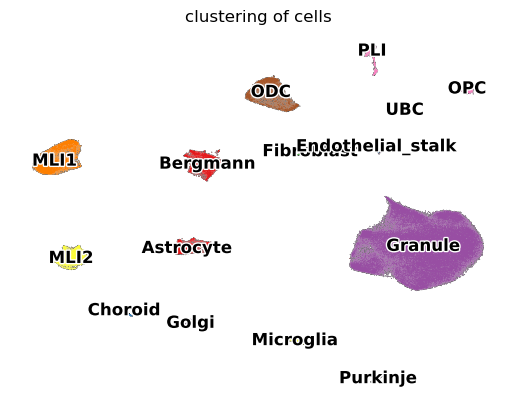

In [15]:
sc.pl.umap(
        adata_sc,
        color="cluster",
        add_outline=True,
        legend_loc="on data",
        legend_fontsize=12,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells",
        palette="Set1",
    )

In [48]:
dnn_train(adata_sc, 
          labels = 'cluster', 
          hidden_dim = 800, 
          train_percent = 0.8, 
          epoches = 200, 
          batch_size = 4096, 
          learning_rate = 0.01, 
          model_save_path = '../downstream_analysis/data/cross_region/Macaque_cb/Macaque_model')



==> Preprocessing...

==> Predataloader...

==> DnnModel...

==> train...
[epoch 1], loss: 0.7268294095993042, acc：0.7113613101330604

==> save model...0
[epoch 2], loss: 0.4145790636539459, acc：0.790621801432958

==> save model...1
[epoch 3], loss: 0.3173709809780121, acc：0.8086617195496417

==> save model...2
[epoch 4], loss: 0.2795172929763794, acc：0.8140992835209826

==> save model...3
[epoch 5], loss: 0.26867038011550903, acc：0.8111885875127943
[epoch 6], loss: 0.27406442165374756, acc：0.8196967758444217

==> save model...4
[epoch 7], loss: 0.294618159532547, acc：0.8149948822927329
[epoch 8], loss: 0.2875242531299591, acc：0.8196328045035824
[epoch 9], loss: 0.2775765061378479, acc：0.8171059365404298
[epoch 10], loss: 0.23621097207069397, acc：0.8180335209825998
[epoch 11], loss: 0.2681269645690918, acc：0.8174257932446264
[epoch 12], loss: 0.25113439559936523, acc：0.822063715455476

==> save model...5
[epoch 13], loss: 0.2613314688205719, acc：0.8180015353121801
[epoch 14], loss: 0.

/tmp/ipykernel_7338/3092593498.py:92: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model)


{'Endothelial_stalk', 'Granule', 'UBC', 'Fibroblast', 'Astrocyte', 'PLI', 'OPC', 'Bergmann', 'Choroid', 'ODC', 'MLI2', 'MLI1', 'Microglia', 'Golgi', 'Purkinje'}


cell_type_annotation_model.py:146: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
cell_type_annotation_model.py:175: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/autocast_mode.py:265: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/nn/functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean

  [Epoch   1] Loss: 220.98203, Time: 31.04 s, Psuedo-Acc: 7.40%
  [Epoch   2] Loss: 185.77187, Time: 62.11 s, Psuedo-Acc: 7.16%
  [Epoch   3] Loss: 160.90416, Time: 93.40 s, Psuedo-Acc: 8.82%
  [Epoch   4] Loss: 126.84799, Time: 124.38 s, Psuedo-Acc: 8.07%
  [Epoch   5] Loss: 110.23603, Time: 155.53 s, Psuedo-Acc: 8.35%
  [Epoch   6] Loss: 96.47930, Time: 186.76 s, Psuedo-Acc: 8.86%
  [Epoch   7] Loss: 86.87257, Time: 217.99 s, Psuedo-Acc: 9.33%
  [Epoch   8] Loss: 79.08203, Time: 249.06 s, Psuedo-Acc: 9.72%
  [Epoch   9] Loss: 73.18275, Time: 280.13 s, Psuedo-Acc: 10.56%
  [Epoch  10] Loss: 68.89674, Time: 311.19 s, Psuedo-Acc: 10.90%
  [Epoch  11] Loss: 66.00705, Time: 342.24 s, Psuedo-Acc: 11.27%
  [Epoch  12] Loss: 64.22496, Time: 373.33 s, Psuedo-Acc: 11.25%
  [Epoch  13] Loss: 62.86285, Time: 404.49 s, Psuedo-Acc: 11.43%
  [Epoch  14] Loss: 61.63523, Time: 435.51 s, Psuedo-Acc: 11.38%
  [Epoch  15] Loss: 60.62347, Time: 466.69 s, Psuedo-Acc: 11.45%
  [Epoch  16] Loss: 59.72052, T

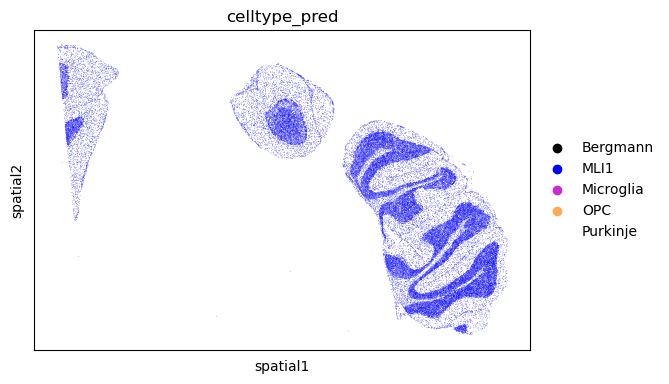

In [52]:
#Read in spatial group data

#spatial_adata = sc.read('../spatial/A5.h5ad')
params = {
    'pca_dim': 100,  
    'k_graph': 20,
    'edge_weight': True,
    'kd_T': 3,
    'feat_dim': 1000,
    'w_dae': 10.0,
    'w_gae': 5.0,
    'w_cls': 50.0,
    'epochs': 100,
    'lr': 0.0005,
}

transfer(adata, 
         model = '../downstream_analysis/data/cross_region/Macaque_cb/Macaque_model_12.dnnmodel', 
         transfer_batchsize = 4096, 
         result_csv = '../downstream_analysis/data/cross_region/Macaque_cb/spsc_transfer_T44_12_echo100.csv', 
         new_adata ='../downstream_analysis/data/cross_region/Macaque_cb/sptrans.h5ad', 
         device = 'cpu',
         k_graph = 20,
         params = params)


### Hippocampus

In [6]:
df = pd.read_csv("data/cross_region/total_genecount_df_hippocampus.csv", sep=",")  # 如果你是从文件读取
# 注意：图像数组需要实际读取，这里只是示意结构。如果没有图像，可以省略或保留空字典。
adatasp = MakeSpAnndata(df)
# 6. (可选) 设置基因和细胞名称
# 通常在创建 AnnData 时通过 obs 和 var 的索引自动设置，但你可以检查或重命名：
print("Cell names:", adatasp.obs_names[:5])
print("Gene names:", adatasp.var_names[:5])
print(adatasp)
adatasp.write_h5ad('data/cross_region/Macaque.hipposp.h5ad')

Cell names: Index(['23', '100', '108', '179', '206'], dtype='object', name='cell_label')
Gene names: Index(['A2M', 'A2ML1', 'A3GALT2', 'AAAS', 'AACS'], dtype='object', name='gene_id')
AnnData object with n_obs × n_vars = 19756 × 28965
    obs: 'x_original', 'y_original'
    uns: 'spatial'
    obsm: 'spatial'


In [34]:
os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
#adatasp = sc.read_h5ad('data/cross_region/Macaque.hipposp.h5ad')
#adatasc = sc.read_h5ad('data/cross_region/Macaque.hipposc.h5ad')
adatasp = sc.read_h5ad('data/cross_region/Macaque.mystereo.hippoT47.h5ad')

###### macaque resphus make

In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.io import mmread
# 读取矩阵和注释
counts = mmread("data/cross_region/Macaque_hippo/rhesus_macaques/counts.mtx").T.tocsr() # 注意转置
genes = pd.read_csv("data/cross_region/Macaque_hippo/rhesus_macaques/genes.tsv", header=None, sep='\t')[0].values
barcodes = pd.read_csv("data/cross_region/Macaque_hippo/rhesus_macaques/barcodes.tsv", header=None, sep='\t')[0].values
metadata = pd.read_csv("data/cross_region/Macaque_hippo/rhesus_macaques/metadata.csv", index_col=0)

# 创建 AnnData 对象
adatasc = sc.AnnData(X = counts, obs = metadata, var = pd.DataFrame(index=genes))
adatasc.obs_names = barcodes
adatasc.var_names = genes

# 添加降维信息
#pca_emb = pd.read_csv("data/cross_region/Macaque_hippo/rhesus_macaques/pca_embeddings.csv", index_col=0)
umap_emb = pd.read_csv("data/cross_region/Macaque_hippo/rhesus_macaques/umap_embeddings.csv", index_col=0)
#adatasc.obsm['X_pca'] = pca_emb.loc[adatasc.obs_names].values
adatasc.obsm['X_umap'] = umap_emb.loc[adatasc.obs_names].values

# 保存
adatasc.write("data/cross_region/Macaque_hippo/rhesus_macaques/Macaque.hipposc_rh.h5ad")

In [49]:
import pandas as pd
import numpy as np
from mygene import MyGeneInfo

# 假设您的AnnData对象名为 adata
# 初始化MyGeneInfo对象，指定物种为猕猴（taxid=9544）
mg = MyGeneInfo()

# 1. 获取原始基因ID列表
current_gene_ids = adatasc.var_names.tolist()

# 2. 使用mygene进行批量查询
# 注意：scopes参数需与您的基因ID类型匹配，例如'ensemblgene', 'entrezgene'等。
gene_info = mg.querymany(current_gene_ids, 
                         scopes='ensemblgene', 
                         fields='symbol', 
                         species='9544', 
                         as_dataframe=True)

print(f"查询返回的总行数: {len(gene_info)}")
print(f"原始基因ID数量: {len(current_gene_ids)}")

# 3. 处理重复的基因ID（核心步骤）
# 为每个基因ID只保留第一个出现的Symbol记录
gene_info_dedup = gene_info.loc[~gene_info.index.duplicated(keep='first')]

print(f"去重后的唯一基因ID数量: {len(gene_info_dedup)}")

#adatasc
symbols = gene_info_dedup.loc[current_gene_ids, 'symbol'].values # 根据原始ID顺序获取symbol
# 将Symbol赋值给AnnData的var_names（即成为基因的新名称）
adatasc.var_names = symbols

In [51]:
#adatasc.var
adatasc.write("data/cross_region/Macaque_hippo/rhesus_macaques/Macaque.hipposc_rh.h5ad")

/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:343: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:352: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


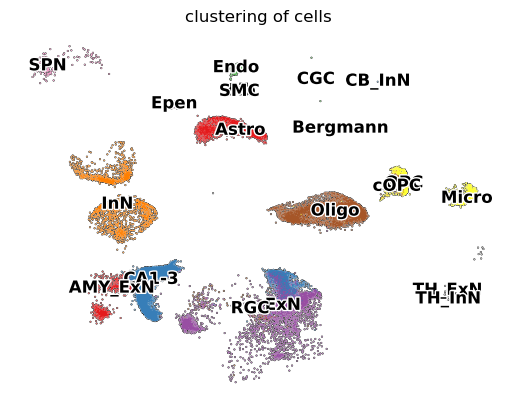

In [39]:
#adatasc_hub = adatasc[adatasc.obs['region'] == 'Hippocampus', :].copy()
#adatasc.obsm['X_umap'] = adatasc.obsm['X_UMAP']  # 复制一份并命名为标准键名
# 或者直接重命名（如果确定不再需要原来的 'X_UMAP' 键）
# adatasc_hub.obsm['X_umap'] = adatasc_hub.obsm.pop('X_UMAP')

sc.pl.umap(
        adatasc,
        color="Celltype",
        add_outline=True,
        legend_loc="on data",
        legend_fontsize=12,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells",
        palette="Set1"
    )

##### human make

/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:343: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:352: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


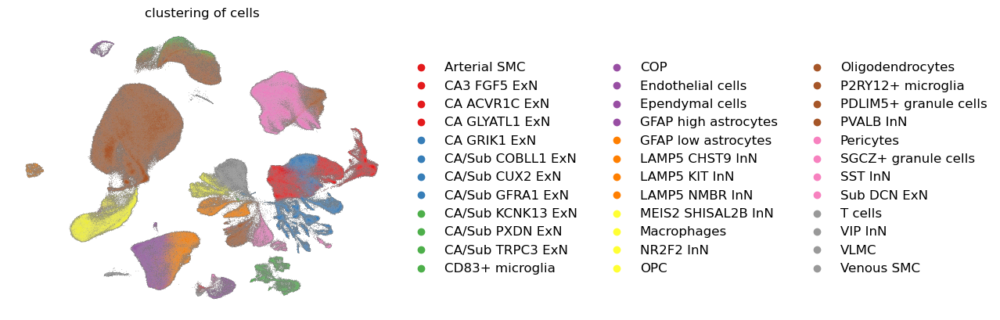

In [5]:
adatasc = sc.read_h5ad('data/cross_region/bd4d30d2-6def-4bc1-932c-aca3fba52fd0.h5ad')
#adatasc.obsm['X_umap'] = adatasc.obsm['X_UMAP']
sc.pl.umap(
        adatasc,
        color="Curated_annotation",
        add_outline=True,
        #legend_loc="on data",
        legend_fontsize=12,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells",
        palette="Set1"
    )

细胞类型 'Arterial SMC': 472 个细胞（保留全部）
细胞类型 'CA3 FGF5 ExN': 15292 -> 1000 个细胞
细胞类型 'CA ACVR1C ExN': 31529 -> 1000 个细胞
细胞类型 'CA GLYATL1 ExN': 15241 -> 1000 个细胞
细胞类型 'CA GRIK1 ExN': 25631 -> 1000 个细胞
细胞类型 'CA/Sub COBLL1 ExN': 12763 -> 1000 个细胞
细胞类型 'CA/Sub CUX2 ExN': 9240 -> 1000 个细胞
细胞类型 'CA/Sub GFRA1 ExN': 9579 -> 1000 个细胞
细胞类型 'CA/Sub KCNK13 ExN': 3170 -> 1000 个细胞
细胞类型 'CA/Sub PXDN ExN': 4160 -> 1000 个细胞
细胞类型 'CA/Sub TRPC3 ExN': 5118 -> 1000 个细胞
细胞类型 'CD83+ microglia': 8436 -> 1000 个细胞
细胞类型 'COP': 1062 -> 1000 个细胞
细胞类型 'Endothelial cells': 4064 -> 1000 个细胞
细胞类型 'Ependymal cells': 1913 -> 1000 个细胞
细胞类型 'GFAP high astrocytes': 35574 -> 1000 个细胞
细胞类型 'GFAP low astrocytes': 30138 -> 1000 个细胞
细胞类型 'LAMP5 CHST9 InN': 8837 -> 1000 个细胞
细胞类型 'LAMP5 KIT InN': 5600 -> 1000 个细胞
细胞类型 'LAMP5 NMBR InN': 2935 -> 1000 个细胞
细胞类型 'MEIS2 SHISAL2B InN': 652 个细胞（保留全部）
细胞类型 'Macrophages': 476 个细胞（保留全部）
细胞类型 'NR2F2 InN': 8787 -> 1000 个细胞
细胞类型 'OPC': 46434 -> 1000 个细胞
细胞类型 'Oligodendrocytes': 196021 -> 1000 个细胞
细胞

/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:343: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:352: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


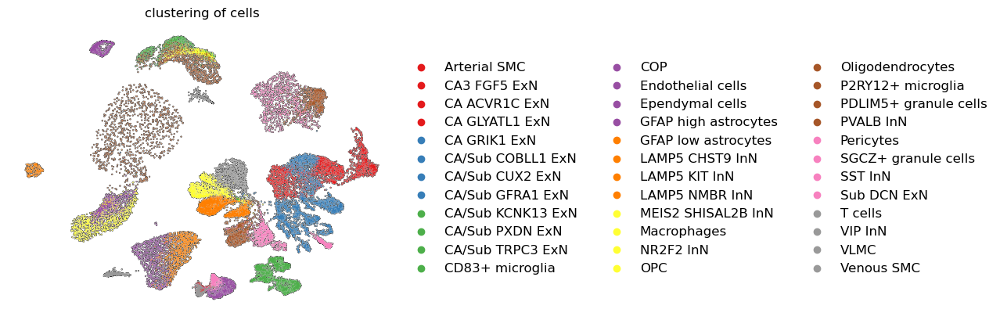

AnnData object with n_obs × n_vars = 33962 × 37739
    obs: 'Dataset', 'donor_id', 'suspension_type', 'Original_annotation', 'CellHint_harmonised_group', 'Curated_annotation', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'is_primary_data', 'self_reported_ethnicity_ontology_term_id', 'sex_ontology_term_id', 'tissue_type', 'tissue_ontology_term_id', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'exist_in_Ayhan2021', 'exist_in_Franjic2022', 'exist_in_Tran2021', 'exist_in_Siletti2022', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'default_embedding', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title', 'Curated_annotation_colors'
    obsm: 'X_umap'


In [7]:
import scanpy as sc
import pandas as pd
import numpy as np

def stratified_subsample(adata, cell_type_key='Curated_annotation', target_n=1000, random_state=42):
    """
    对AnnData对象进行基于细胞类型的分层下采样
    
    参数:
        adata: AnnData对象
        cell_type_key: obs中细胞类型注释的列名
        target_n: 每个细胞类型下采样的目标数量（默认1000）
        random_state: 随机种子，确保结果可重复
    
    返回:
        下采样后的新AnnData对象
    """
    # 检查细胞类型列是否存在
    if cell_type_key not in adata.obs.columns:
        raise ValueError(f"列 '{cell_type_key}' 不存在于 adata.obs 中。请检查列名。")
    
    # 设置随机种子
    np.random.seed(random_state)
    
    # 获取所有细胞类型的下采样索引
    sampled_indices = []
    
    # 按细胞类型分组处理
    for cell_type, group_df in adata.obs.groupby(cell_type_key):
        n_cells = len(group_df)
        
        if n_cells > target_n:
            # 如果该类型细胞数大于目标值，随机下采样
            sampled_indices.extend(
                group_df.sample(n=target_n, random_state=random_state).index
            )
            print(f"细胞类型 '{cell_type}': {n_cells} -> {target_n} 个细胞")
        else:
            # 如果该类型细胞数不足目标值，保留全部
            sampled_indices.extend(group_df.index)
            print(f"细胞类型 '{cell_type}': {n_cells} 个细胞（保留全部）")
    
    # 创建下采样后的AnnData对象
    downsampled_adata = adata[sampled_indices, :].copy()
    
    # 打印总结信息
    original_shape = adata.shape
    new_shape = downsampled_adata.shape
    print(f"\n下采样完成:")
    print(f"原始数据: {original_shape[0]} 个细胞, {original_shape[1]} 个基因")
    print(f"下采样后: {new_shape[0]} 个细胞, {new_shape[1]} 个基因")
    print(f"细胞保留比例: {new_shape[0]/original_shape[0]:.2%}")
    
    return downsampled_adata

# 使用示例
# 假设您的AnnData对象名为 adata，细胞类型注释列名为 'celltype'
adatasc_down = stratified_subsample(adatasc, cell_type_key='Curated_annotation')
sc.pl.umap(
        adatasc_down,
        color="Curated_annotation",
        add_outline=True,
        #legend_loc="on data",
        legend_fontsize=12,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells",
        palette="Set1"
    )
print(adatasc_down)

In [10]:
#adatasc_down.var
import pandas as pd
import numpy as np
from mygene import MyGeneInfo

# 假设您的AnnData对象名为 adata
# 初始化MyGeneInfo对象，指定物种为猕猴（taxid=9544）
mg = MyGeneInfo()

# 1. 获取原始基因ID列表
current_gene_ids = adatasc_down.var_names.tolist()

# 2. 使用mygene进行批量查询
# 注意：scopes参数需与您的基因ID类型匹配，例如'ensemblgene', 'entrezgene'等。
gene_info = mg.querymany(current_gene_ids, 
                         scopes='ensemblgene', 
                         fields='symbol', 
                         species='9606', 
                         as_dataframe=True)

print(f"查询返回的总行数: {len(gene_info)}")
print(f"原始基因ID数量: {len(current_gene_ids)}")

# 3. 处理重复的基因ID（核心步骤）
# 为每个基因ID只保留第一个出现的Symbol记录
gene_info_dedup = gene_info.loc[~gene_info.index.duplicated(keep='first')]

print(f"去重后的唯一基因ID数量: {len(gene_info_dedup)}")

#adatasc
symbols = gene_info_dedup.loc[current_gene_ids, 'symbol'].values # 根据原始ID顺序获取symbol
# 将Symbol赋值给AnnData的var_names（即成为基因的新名称）
adatasc_down.var_names = symbols

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
11 input query terms found dup hits:	[('ENSG00000278294', 3), ('ENSG00000273730', 10), ('ENSG00000275757', 10), ('ENSG00000226506', 2), (
183 input query terms found no hit:	['ENSG00000232949', 'ENSG00000233214', 'ENSG00000232680', 'ENSG00000236453', 'ENSG00000236938', 'ENS


查询返回的总行数: 37771
原始基因ID数量: 37739
去重后的唯一基因ID数量: 37739


In [13]:
adatasc_down

AnnData object with n_obs × n_vars = 33962 × 37739
    obs: 'Dataset', 'donor_id', 'suspension_type', 'Original_annotation', 'CellHint_harmonised_group', 'Curated_annotation', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'is_primary_data', 'self_reported_ethnicity_ontology_term_id', 'sex_ontology_term_id', 'tissue_type', 'tissue_ontology_term_id', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'exist_in_Ayhan2021', 'exist_in_Franjic2022', 'exist_in_Tran2021', 'exist_in_Siletti2022', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'default_embedding', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title', 'Curated_annotation_colors'
    obsm: 'X_umap'

In [ ]:
adatasc_down.write("data/cross_region/Macaque_hippo/human/Macaque.hipposc_hp_down.h5ad")

#### train and map

In [44]:
#adatasc = sc.read_h5ad('data/cross_region/Macaque.hipposc.h5ad')
adatasc
dnn_train(adatasc, 
          labels = 'label', 
          hidden_dim = 800, 
          train_percent = 0.8, 
          epoches = 50, 
          batch_size = 4096, 
          learning_rate = 0.01, 
          model_save_path = 'data/cross_region/Macaque_hippo/macaque/Hippo_model')


==> Preprocessing...

==> Predataloader...

==> DnnModel...

==> train...
[epoch 1], loss: 1.6224822998046875, acc：0.5726592391173568

==> save model...0
[epoch 2], loss: 1.267655849456787, acc：0.6406381596361623

==> save model...1
[epoch 3], loss: 1.1786139011383057, acc：0.6631855042471786

==> save model...2
[epoch 4], loss: 0.9570316672325134, acc：0.6908583391486393

==> save model...3
[epoch 5], loss: 0.9076215028762817, acc：0.7100849435714801

==> save model...4
[epoch 6], loss: 0.8932577967643738, acc：0.7279880645859903

==> save model...5
[epoch 7], loss: 0.8493680953979492, acc：0.737396828452487

==> save model...6
[epoch 8], loss: 0.7848303914070129, acc：0.7374449551218808

==> save model...7
[epoch 9], loss: 0.7315195798873901, acc：0.7499097624948865

==> save model...8
[epoch 10], loss: 0.7644498944282532, acc：0.7478403157109512
[epoch 11], loss: 0.7923664450645447, acc：0.7453858555718651
[epoch 12], loss: 0.7273791432380676, acc：0.7482493924007989
[epoch 13], loss: 0.7700

/tmp/ipykernel_7338/3092593498.py:92: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model)


{'GC_2', 'PhgMG_cRG', 'Pyr_2', 'NFOL', 'GC_1', 'Microglia_2', 'Microglia_1', 'RGL_1', 'Astro_3', 'OPC_1', 'IPC_2', 'Astro_1', 'Ependymal', 'Pre_OPC', 'PVM', 'GC_im', 'PhgMG_RGL', 'OPC_2', 'NB', 'Astro_2', 'PhgMG_Pyr', 'GABA', 'CR', 'Endothelial', 'Astro_im2', 'MOL', 'Astro_im1', 'RGL_2', 'Unk', 'Astro_4', 'VLMC', 'GC_3'}


cell_type_annotation_model.py:146: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
cell_type_annotation_model.py:175: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/autocast_mode.py:265: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/nn/functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean

  [Epoch   1] Loss: 87.15434, Time: 2.89 s, Psuedo-Acc: 2.71%
  [Epoch   2] Loss: 96.91615, Time: 5.72 s, Psuedo-Acc: 3.30%
  [Epoch   3] Loss: 68.67426, Time: 8.60 s, Psuedo-Acc: 2.43%
  [Epoch   4] Loss: 59.01212, Time: 11.51 s, Psuedo-Acc: 2.40%
  [Epoch   5] Loss: 52.54768, Time: 14.38 s, Psuedo-Acc: 2.44%
  [Epoch   6] Loss: 47.35175, Time: 17.27 s, Psuedo-Acc: 3.25%
  [Epoch   7] Loss: 43.49997, Time: 20.15 s, Psuedo-Acc: 5.01%
  [Epoch   8] Loss: 40.86697, Time: 23.03 s, Psuedo-Acc: 6.20%
  [Epoch   9] Loss: 39.13233, Time: 25.87 s, Psuedo-Acc: 6.82%
  [Epoch  10] Loss: 37.69324, Time: 28.75 s, Psuedo-Acc: 7.47%
  [Epoch  11] Loss: 36.46173, Time: 31.66 s, Psuedo-Acc: 7.86%
  [Epoch  12] Loss: 35.39011, Time: 34.59 s, Psuedo-Acc: 7.87%
  [Epoch  13] Loss: 34.44931, Time: 37.48 s, Psuedo-Acc: 8.36%
  [Epoch  14] Loss: 33.66010, Time: 40.34 s, Psuedo-Acc: 8.89%
  [Epoch  15] Loss: 33.07595, Time: 43.25 s, Psuedo-Acc: 8.85%
  [Epoch  16] Loss: 32.67763, Time: 46.16 s, Psuedo-Acc: 9

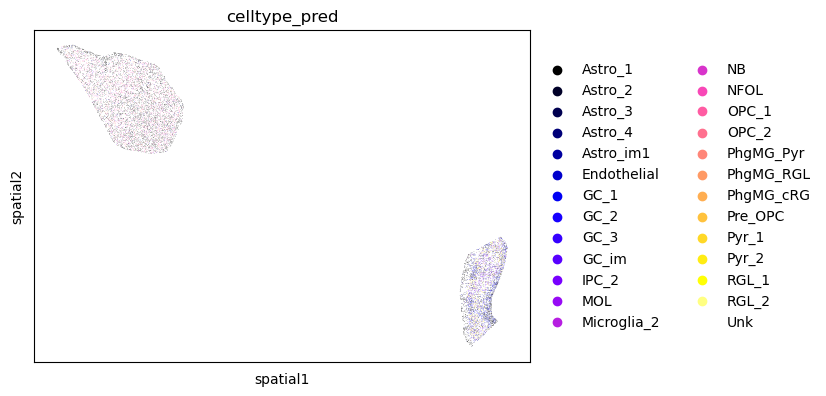

In [45]:
#Read in spatial group data
#adatasp = sc.read_h5ad('data/cross_region/Macaque.hipposp.h5ad')
adatasp = sc.read_h5ad('data/cross_region/Macaque.mystereo.hippoT47.h5ad')
#spatial_adata = sc.read('../spatial/A5.h5ad')
params = {
    'pca_dim': 100,  
    'k_graph': 30,
    'edge_weight': True,
    'kd_T': 3,
    'feat_dim': 300,
    'w_dae': 10.0,
    'w_gae': 5.0,
    'w_cls': 50.0,
    'epochs': 100,
    'lr': 0.0005,
}

transfer(adatasp, 
         model = '../downstream_analysis/data/cross_region/Macaque_hippo/macaque/Hippo_model_17.dnnmodel', 
         transfer_batchsize = 4096, 
         result_csv = '../downstream_analysis/data/cross_region/Macaque_hippo/human/spsc_transfer_hippo_100_T47_echo30.csv', 
         new_adata ='../downstream_analysis/data/cross_region/Macaque_hippo/human/spsc_transfer_hippo_100_T47_echo30.h5ad', 
         device = 'cpu',
         k_graph = 30,
         params = params)


/tmp/ipykernel_15354/3092593498.py:92: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model)


{'NFOL', 'GABA', 'GC_im', 'Microglia_1', 'RGL_1', 'GC_3', 'Astro_4', 'RGL_2', 'Microglia_2', 'CR', 'Ependymal', 'PhgMG_cRG', 'Endothelial', 'Astro_im1', 'Pyr_2', 'PhgMG_RGL', 'GC_1', 'IPC_1', 'GC_2', 'PVM', 'IPC_2', 'PhgMG_Pyr', 'Astro_im2', 'OPC_2', 'Pre_OPC', 'VLMC', 'Astro_2', 'Astro_1', 'Unk', 'NB', 'MOL', 'Astro_3', 'OPC_1'}


cell_type_annotation_model.py:146: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
cell_type_annotation_model.py:175: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/autocast_mode.py:265: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/nn/functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean

  [Epoch   1] Loss: 83.45686, Time: 8.80 s, Psuedo-Acc: 2.28%
  [Epoch   2] Loss: 95.54236, Time: 17.73 s, Psuedo-Acc: 2.13%
  [Epoch   3] Loss: 72.35087, Time: 26.66 s, Psuedo-Acc: 2.69%
  [Epoch   4] Loss: 63.08329, Time: 35.52 s, Psuedo-Acc: 2.50%
  [Epoch   5] Loss: 54.59539, Time: 44.27 s, Psuedo-Acc: 3.30%
  [Epoch   6] Loss: 50.14653, Time: 53.10 s, Psuedo-Acc: 4.71%
  [Epoch   7] Loss: 45.13800, Time: 61.89 s, Psuedo-Acc: 5.98%
  [Epoch   8] Loss: 41.96444, Time: 70.69 s, Psuedo-Acc: 6.74%
  [Epoch   9] Loss: 39.75380, Time: 79.41 s, Psuedo-Acc: 7.83%
  [Epoch  10] Loss: 38.48405, Time: 88.32 s, Psuedo-Acc: 8.54%
  [Epoch  11] Loss: 37.65144, Time: 97.04 s, Psuedo-Acc: 9.16%
  [Epoch  12] Loss: 37.00904, Time: 105.78 s, Psuedo-Acc: 9.37%
  [Epoch  13] Loss: 36.18590, Time: 114.74 s, Psuedo-Acc: 9.54%
  [Epoch  14] Loss: 35.52244, Time: 123.53 s, Psuedo-Acc: 9.64%
  [Epoch  15] Loss: 34.95146, Time: 132.32 s, Psuedo-Acc: 9.62%
  [Epoch  16] Loss: 34.39890, Time: 141.11 s, Psuedo

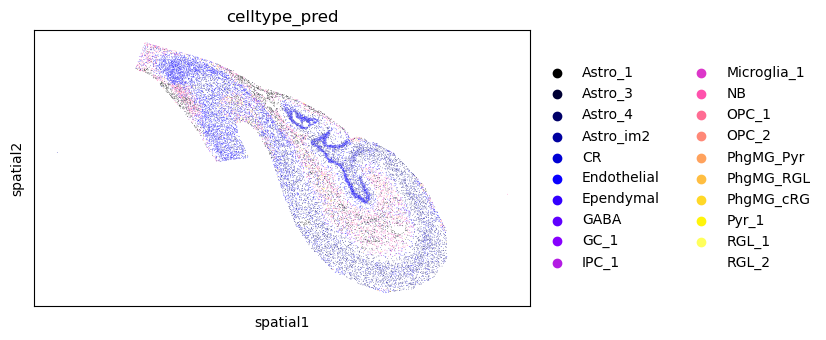

In [9]:
#Read in spatial group data
os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
adatasp = sc.read_h5ad('data/cross_region/Macaque.hipposp.h5ad')
#spatial_adata = sc.read('../spatial/A5.h5ad')
params = {
    'pca_dim': 100,  
    'k_graph': 20,
    'edge_weight': True,
    'kd_T': 3,
    'feat_dim': 300,
    'w_dae': 30.0,
    'w_gae': 5.0,
    'w_cls': 50.0,
    'epochs': 30,
    'lr': 0.0005,
}

transfer(adatasp, 
         model = '../downstream_analysis/data/cross_region/Macaque_hippo/macaque/Hippo_model_17.dnnmodel', 
         transfer_batchsize = 4096, 
         result_csv = '../downstream_analysis/data/cross_region/Macaque_hippo/spsc_transfer_hippo_100_T44_echo50.csv', 
         new_adata ='../downstream_analysis/data/cross_region/Macaque_hippo/spsc_transfer_hippo_100_T44_echo50.h5ad', 
         device = 'cpu',
         k_graph = 30,
         params = params)


In [7]:
adatasp.obsm['spatial']

array([[35514., 80727.],
       [12957., 78645.],
       [28160., 80840.],
       ...,
       [22636., 76255.],
       [25562., 78288.],
       [27465., 79739.]])

## Cell2location

In [1]:
import torch
print(f"PyTorch版本: {torch.__version__}")
print(f"CUDA版本: {torch.version.cuda}")
print(f"GPU可用: {torch.cuda.is_available()}")
print(f"GPU数量: {torch.cuda.device_count()}")
print(f"GPU名称: {torch.cuda.get_device_name(0)}")

PyTorch版本: 2.4.0
CUDA版本: None
GPU可用: False
GPU数量: 0


AssertionError: Torch not compiled with CUDA enabled

In [ ]:
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip install --quiet scvi-colab
    from scvi_colab import install
    install()
    !pip install --quiet git+https://github.com/BayraktarLab/cell2location#egg=cell2location[tutorials]

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

import cell2location

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text for PDFs

In [3]:
torch.cuda.is_available()

False

In [2]:
os.chdir("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/")
results_folder = '"tilgner/cell2loc'
# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'


In [3]:
import scanpy as sc
import os
os.chdir("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/")
adata = sc.read('C12L/C03542C6.cellbin.h5ad')
adata_sc = sc.read('tilgner/combined_mtx/seurat_converted.h5ad')
adata_sc
print(adata_sc)

AnnData object with n_obs × n_vars = 66647 × 14197
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'sample_id', 'batch', 'n_counts', 'n_genes_by_counts', 'annotation', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', '_indices', '_scvi_batch', 'cell_type'
    var: 'highly_variable', 'n_cells', 'nonz_mean'
    uns: 'cell_type_colors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'integrated_data'


In [5]:
# 将 'count' layer 中的数据设置为默认矩阵
adata_sc.X = adata_sc.layers['counts'].copy()  # 使用 .copy() 避免视图问题
# 操作后，可以再次查看对象摘要确认
print(adata_sc)

AnnData object with n_obs × n_vars = 66647 × 14197
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'sample_id', 'batch', 'n_counts', 'n_genes_by_counts', 'annotation', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', '_indices', '_scvi_batch', 'cell_type'
    var: 'highly_variable', 'n_cells', 'nonz_mean'
    uns: 'cell_type_colors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'integrated_data'


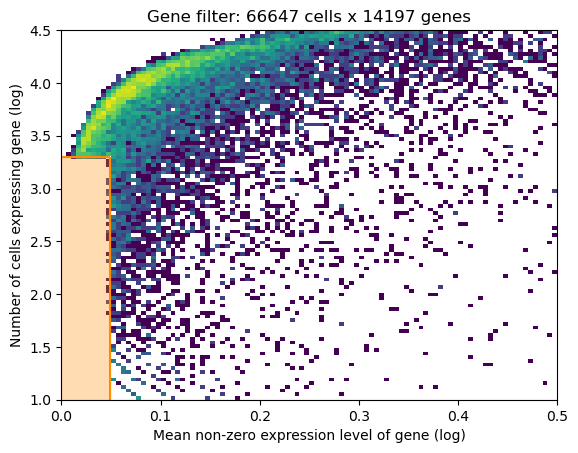

In [6]:
# Normalizing to median total counts
#sc.pp.normalize_total(adata_sc)
# Logarithmize the data
#sc.pp.log1p(adata_sc)
from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_sc, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
# filter the object
adata_sc = adata_sc[:, selected].copy()

In [7]:
# prepare anndata for the regression model
cell2location.models.RegressionModel.setup_anndata(adata=adata_sc,
                        # 10X reaction / sample / batch
                        batch_key='batch',
                        # cell type, covariate used for constructing signatures
                        labels_key='cell_type'
                       )

KeyError: 'post_sample_means'

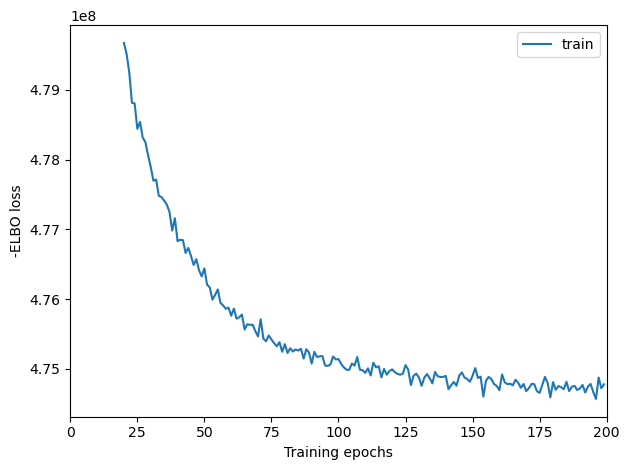

In [13]:
# create the regression model
from cell2location.models import RegressionModel
# mod = RegressionModel(adata_sc)

# view anndata_setup as a sanity check
mod.view_anndata_setup()
mod.train(max_epochs=200)
mod.plot_history(20)
mod.plot_QC()

In [ ]:
adata_sc

In [14]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_sc = mod.export_posterior(
    adata_sc, sample_kwargs={'num_samples': 1000, 'batch_size': 2500}
)

# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
adata_sc.write(adata_file)
adata_file

Sampling global variables, sample: 100%|██████████| 999/999 [03:14<00:00,  5.13it/s]


'"tilgner/cell2loc/reference_signatures/sc.h5ad'

In [15]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_sc.varm.keys():
    inf_aver = adata_sc.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_sc.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_sc.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_sc.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_sc.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]

,Glia::Astro::Astrocytes,Glia::Astro::BergmannGlia,Glia::Astro::Ependymal,Glia::Astro::RGL,Glia::Oligo::COPs
Xkr4,0.002040,0.005744,0.013174,0.016299,0.140270
Sox17,0.000837,0.005049,0.031310,0.009299,0.039190
Mrpl15,0.218092,0.667131,0.271636,0.625306,0.625401
Lypla1,0.084461,0.292271,0.172747,0.143398,0.157114
Tcea1,0.270460,0.827031,0.874789,0.680762,1.320994


In [21]:
adata.write("sp_adata_model.h5ad")
adata_sc.write("sc_adata_model.h5ad")
adata = sc.read_h5ad("sp_adata_model.h5ad")
adata_sc = sc.read_h5ad("sc_adata_model.h5ad")

In [16]:
intersect = np.intersect1d(adata.var_names, inf_aver.index)
adata = adata[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata)
#cell2location.models.Cell2location.setup_anndata(adata=adata)
# create and train the model
mod = cell2location.models.Cell2location(
    adata, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=30,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
)
mod.view_anndata_setup()

mod.train(max_epochs=10000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size=1
         )



Anndata setup with scvi-tools version 1.3.0.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': None,
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 70313 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 14025 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/cluster/home/liuhengxin/software/miniconda3_2/envs/cell2loc_env/lib/python3.13/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
SLURM auto-requeueing enabled. Setting signal handlers.
/cluster/home/liuhengxin/software/miniconda3_2/envs/cell2loc_env/lib/python3.13/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.
/cluster/home/liuhengxin/software/miniconda3_2/envs/cell2loc_env/lib/python3.13/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a

Epoch 21/10000:   0%|          | 20/10000 [12:58<108:24:23, 39.10s/it, v_num=1, elbo_train=1.13e+8]


Detected KeyboardInterrupt, attempting graceful shutdown ...


SystemExit: 1

/cluster/home/liuhengxin/software/miniconda3_2/envs/cell2loc_env/lib/python3.13/site-packages/IPython/core/interactiveshell.py:3707: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)

KeyboardInterrupt



In [ ]:
# plot ELBO loss history during training, removing first 100 epochs from the plot
#mod.plot_history(1000)
#plt.legend(labels=['full data training']);

# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata = mod.export_posterior(
    adata, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata.write(adata_file)
adata_file


In [ ]:
adata

In [ ]:
sc.pl.spatial(adata, img_key=None, color=['_scvi_batch'], palette  =  'gnuplot2', spot_size=30, show=True)

## GraphST

In [4]:
import os
import torch
import pandas as pd
import scanpy as sc
from sklearn import metrics
import multiprocessing as mp
from GraphST import GraphST

In [2]:
# os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
# adata = sc.read('../downstream_analysis/data/cross_region/Macaque.mystereo.h5ad')
# adata_sc = sc.read('../downstream_analysis/data/cross_region/Macaque.sn.norm.h5ad')
os.chdir("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/")
adata = sc.read('C12L/C03542C6.cellbin.h5ad')
adata_sc = sc.read('tilgner/combined_mtx/seurat_converted.h5ad')
adata_sc
print(adata_sc)

Only considering the two last: ['.norm', '.h5ad'].
Only considering the two last: ['.norm', '.h5ad'].
AnnData object with n_obs × n_vars = 156318 × 20561
    obs: 'orig.ident', 'CellID', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_nFeature_ratio', 'Batch', 'cluster', 'UMAP_1', 'UMAP_2', 'ident', 'annotation'
    uns: 'annotation_colors', 'log1p'
    obsm: 'X_pca', 'X_umap', 'spatial'
    layers: 'count', 'logcounts'


In [5]:
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000)

In [6]:
# preprocessing for ST data
adata.var_names_make_unique()
#GraphST.preprocess(adata)

# build graph
GraphST.construct_interaction(adata)
GraphST.add_contrastive_label(adata)

In [7]:
GraphST.preprocess(adata_sc)
from GraphST.preprocess import filter_with_overlap_gene
adata, adata_sc = filter_with_overlap_gene(adata, adata_sc)
# get features
GraphST.get_feature(adata)
#import torch
# Run device, by default, the package is implemented on 'cpu'. We recommend using GPU.
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
# Train model
model = GraphST.GraphST(adata, adata_sc, epochs=500, random_seed=50, device=device, deconvolution=True)
adata, adata_sc = model.train_map()

Number of overlap genes: 418


/cluster/home/liuhengxin/software/miniconda3_2/envs/GraphST/lib/python3.8/site-packages/GraphST/preprocess.py:34: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["overlap_genes"] = genes
/cluster/home/liuhengxin/software/miniconda3_2/envs/GraphST/lib/python3.8/site-packages/GraphST/preprocess.py:35: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata_sc.uns["overlap_genes"] = genes


Begin to train ST data...


100%|██████████| 500/500 [4:54:19<00:00, 35.32s/it]  


Optimization finished for ST data!
Begin to train scRNA data...


100%|██████████| 500/500 [07:11<00:00,  1.16it/s]


Optimization finished for cell representation learning!
Begin to learn mapping matrix...


100%|██████████| 500/500 [11:37:52<00:00, 83.75s/it]  


Mapping matrix learning finished!


In [8]:
# adata_sc.obs['cell_type'] = adata_sc.obs['annotation']

In [20]:
# Project cells into spatial space
from GraphST.utils import project_cell_to_spot
project_cell_to_spot(adata, adata_sc, retain_percent=0.15)

adata
adata.write_h5ad('C12.graphst.h5ad')
adata_sc.write_h5ad('Graphst_tilgner_sc.graphst.h5ad')

/cluster/home/liuhengxin/software/miniconda3_2/envs/GraphST/lib/python3.8/site-packages/GraphST/utils.py:189: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[df_projection.columns] = df_projection
/cluster/home/liuhengxin/software/miniconda3_2/envs/GraphST/lib/python3.8/site-packages/GraphST/utils.py:189: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[df_projection.columns] = df_projection
/cluster/home/liuhengxin/software/miniconda3_2/envs/GraphST/lib/python3.8/site-packages/GraphST/utils.py:189: PerformanceWar

In [23]:
# adata_sc.obs['cell_type'].unique().to_list()
adata

AnnData object with n_obs × n_vars = 70313 × 418
    obs: 'x', 'y', 'total_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'P56::M1::Cerebellum::Glia::Astro::BergmannGlia', 'P56::M1::Cerebellum::Glia::Astro::Ependymal', 'P56::M1::Cerebellum::Glia::Oligo::COPs', 'P56::M1::Cerebellum::Glia::Oligo::MFOLs', 'P56::M1::Cerebellum::Glia::Oligo::MOLs', 'P56::M1::Cerebellum::Glia::Oligo::OPCs', 'P56::M1::Cerebellum::Neuron::ExciteNeuron::GranuleCells', 'P56::M1::Cerebellum::Neuron::InhibNeuron::Interneuron', 'P56::M1::Cerebellum::Supportive::Immune::Macrophages', 'P56::M1::Cerebellum::Supportive::Immune::Microglia', 'P56::M1::Cerebellum::Supportive::Vasc::Endo', 'P56::M1::Cerebellum::Supportive::Vasc::Pericytes', 'P56::M1::Cerebellum::Supportive::Vasc::SMA', 'P56::M1::Hippocampus::Glia::Astro::Astrocytes', 'P56::M1::Hippocampus::Glia::Astro::E

In [26]:
# os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
#adata = sc.read_h5ad('data/cross_region/Macaque.mb.graphst.h5ad')
import matplotlib as mpl
import matplotlib.pyplot as plt
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

        sc.pl.spatial(adata, cmap='magma',
                  # selected cell types
                  color=['Neuron::ExciteNeuron::ExciteL23', 'Neuron::ExciteNeuron::ExciteL4', 'Neuron::ExciteNeuron::ExciteL5', 
    'Neuron::ExciteNeuron::ExciteL6'],
                  ncols=5, size=1.3,
                  img_key=None, 
                  #img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',spot_size=30,
                  show=False)
        save_path = 'C12_graphST_25_12_18.pdf'
    
    # 确保目标目录存在
        # os.makedirs(os.path.dirname(save_path), exist_ok=True)
    
    # 保存图片，bbox_inches='tight' 可以确保所有元素（如标签）都被保存进去
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        plt.close() # 关闭图形，释放内存

/tmp/ipykernel_30568/1158535589.py:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs['predicted_celltype'] = max_prob_indices
/tmp/ipykernel_30568/1158535589.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs['prediction_confidence'] = max_prob_values


细胞类型预测统计:
predicted_celltype
Glia::Oligo::MOLs                     27644
Supportive::Immune::Microglia         25487
Neuron::ExciteNeuron::GranuleCells     4874
Glia::Astro::Astrocytes                3459
Glia::Oligo::OPCs                      2934
Neuron::InhibNeuron::D1MSN             2290
Neuron::ExciteNeuron::ExciteDG         2142
Neuron::InhibNeuron::D2MSN              967
Neuron::ExciteNeuron::ExciteL4          441
Supportive::Vasc::Endo                   75
Name: count, dtype: int64

预测置信度统计:
count    70313.000000
mean         0.218908
std          0.114182
min          0.069640
25%          0.127183
50%          0.187290
75%          0.275134
max          0.609271
Name: prediction_confidence, dtype: float64


<Figure size 1200x800 with 0 Axes>

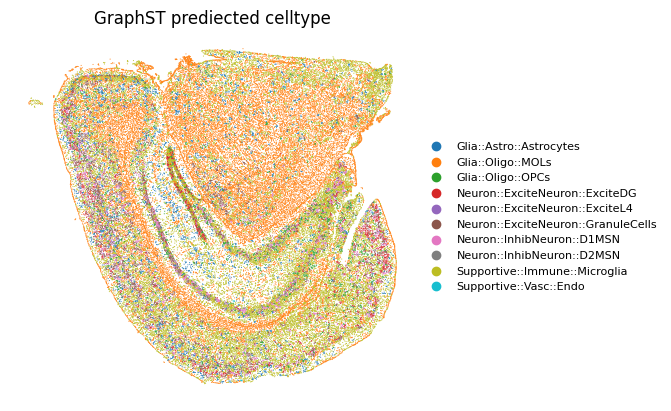

<Figure size 1200x800 with 0 Axes>

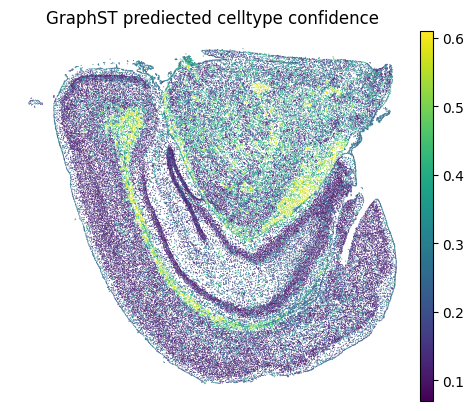

In [24]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 假设您的adata已经加载
# adata = sc.read_h5ad('your_file.h5ad')

# 1. 定义细胞类型列名（根据您的obs列）
cell_type_columns = [
    'Glia::Astro::Astrocytes', 'Glia::Astro::BergmannGlia', 'Glia::Astro::Ependymal', 'Glia::Astro::RGL', 
    'Glia::Oligo::COPs', 'Glia::Oligo::DivOPCs', 'Glia::Oligo::MFOLs', 'Glia::Oligo::MOLs', 'Glia::Oligo::OPCs',
    'Neuron::ExciteNeuron::Cholinergic', 'Neuron::ExciteNeuron::ExciteCA', 'Neuron::ExciteNeuron::ExciteDG', 
    'Neuron::ExciteNeuron::ExciteL23', 'Neuron::ExciteNeuron::ExciteL4', 'Neuron::ExciteNeuron::ExciteL5', 
    'Neuron::ExciteNeuron::ExciteL6', 'Neuron::ExciteNeuron::ExciteNP', 'Neuron::ExciteNeuron::ExciteNeuron', 'Neuron::ExciteNeuron::GranuleCells', 'Neuron::InhibNeuron::D1MSN', 'Neuron::InhibNeuron::D2MSN', 'Neuron::InhibNeuron::InhCajalRetzius', 'Neuron::InhibNeuron::InhibNeuron', 'Neuron::InhibNeuron::Interneuron', 'Neuron::Progenitor::D1D2Patch', 
'Neuron::Progenitor::GranuleNB', 'Neuron::Progenitor::NIPCs', 'Neuron::Progenitor::Neuroblasts', 'Supportive::Immune::Macrophages', 'Supportive::Immune::Microglia', 'Supportive::Vasc::Endo', 'Supportive::Vasc::Fibroblasts', 'Supportive::Vasc::Pericytes', 'Supportive::Vasc::SMA'
]

# 2. 选择每个细胞中概率最大的细胞类型
# 获取每行最大值的列索引
max_prob_indices = adata.obs[cell_type_columns].idxmax(axis=1)
# 获取每行最大值
max_prob_values = adata.obs[cell_type_columns].max(axis=1)

# 3. 将预测的细胞类型添加到obs中
adata.obs['predicted_celltype'] = max_prob_indices
adata.obs['prediction_confidence'] = max_prob_values

# 查看预测结果的统计
print("细胞类型预测统计:")
print(adata.obs['predicted_celltype'].value_counts())

print("\n预测置信度统计:")
print(adata.obs['prediction_confidence'].describe())

# 4. 可视化 - 空间转录组图
# 设置图形大小
plt.figure(figsize=(12, 8))

# 绘制空间分布图
sc.pl.spatial(
    adata, 
    color='predicted_celltype', 
    title='GraphST prediected celltype',
    frameon=False,img_key=None, spot_size=30,
    legend_fontsize=8,
    legend_fontoutline=1,
    size=1.2,  # 点的大小
    show=False
)

# 5. 可选：绘制预测置信度的空间分布
plt.figure(figsize=(12, 8))
sc.pl.spatial(
    adata,
    color='prediction_confidence',
    title='GraphST prediected celltype confidence',
    frameon=False,img_key=None, spot_size=30,
    cmap='viridis',
    size=1.2,
    show=False
)


plt.show()

# 7. 保存结果（可选）
# adata.write_h5ad('your_data_with_predictions.h5ad')

In [ ]:
adata.write_h5ad('C12.graphst.h5ad')

## Check ref

In [1]:
import os
import pandas as pd
import scanpy as sc
#os.chdir("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
adata_sc = sc.read('/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/ref/cross_region/T44.h5ad')
adata_sc
print(adata_sc)


AnnData object with n_obs × n_vars = 15305 × 15555
    obs: 'region', 'cellID', 'x', 'y', 'cellType'
    var: 'genenames'
    obsm: 'spatial'


KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [4]:
# 在UMAP图上分别绘制每个基因的表达
marker_genes = ["PVALB","SST","VIP","LAMP5"]
sc.pl.spatial(
    adata_sc, 
    color=marker_genes, # 传入基因列表
    ncols=2, # 设置每行显示的子图数量
    use_raw=False, # 通常使用标准化后的数据用于可视化
    cmap='Reds', # 设置颜色映射，如 'Blues', 'viridis'
    frameon=False,
    title=[f'{gene} Expression' for gene in marker_genes]
)

ValueError: When .uns['spatial'][library_id] does not exist, spot_size must be provided directly.

/cluster/home/liuhengxin/software/miniconda3_2/envs/r-kernel/lib/python3.12/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 15555 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


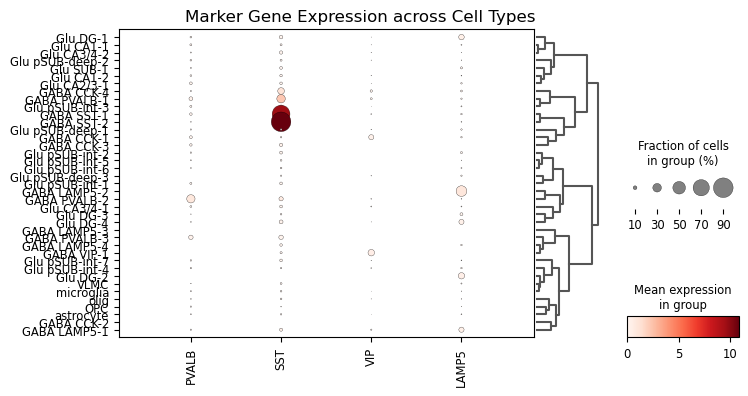

In [7]:
# 绘制点图
marker_genes = ["PVALB","SST","VIP","LAMP5"]
sc.pl.dotplot(
    adata_sc,
    var_names=marker_genes,
    groupby='cellType', # 按细胞类型分组
    figsize=(8, 4), # 调整图形大小
    dendrogram=True, # 是否显示聚类树
    title='Marker Gene Expression across Cell Types'
)

## Analysis PVALB issue

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings('ignore')

In [1]:


# 设置绘图风格
sc.set_figure_params(figsize=(4, 4), dpi=100, fontsize=10)
#sc.logging.print_headers()
print(f"Scanpy version: {sc.__version__}")

# 读取细胞注释信息
cell_anno = pd.read_csv('/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_cell_annotation_withcross_25_10_28.csv')  # 请替换为实际文件路径
print("细胞注释信息:")
print(cell_anno.head())
print(f"细胞注释数据形状: {cell_anno.shape}")

# 读取表达矩阵
expression_matrix = pd.read_csv('/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_gene_T44_macaque_f001_2D_macaque1-20230306.txt',sep = "\t")  # 请替换为实际文件路径
print("\n表达矩阵信息:")
print(expression_matrix.head())
print(f"表达矩阵数据形状: {expression_matrix.shape}")

Scanpy version: 1.10.4
细胞注释信息:
   cell_label subclass class subcortical
0         5.0  Granule   GLU  Cerebellum
1         5.0  Granule   GLU  Cerebellum
2         5.0  Granule   GLU  Cerebellum
3         5.0  Granule   GLU  Cerebellum
4         5.0  Granule   GLU  Cerebellum
细胞注释数据形状: (13770934, 4)

表达矩阵信息:
      gene      x      y  umi_count  cell_label  gene_area     rx     ry
0  SPARCL1  10204  26115          2           0          0  56131  12632
1    DNAH7  10204  26115          1           0          0  56131  12632
2  ANAPC15  10204  26115          1           0          0  56131  12632
3     MOB4  10205  26115          1           0          0  56130  12632
4    OPCML  10205  26115          1           0          0  56130  12632
表达矩阵数据形状: (723590752, 8)


In [2]:
# 将表达矩阵从长格式转换为宽格式（基因×细胞）
# 使用pivot_table处理重复的基因-细胞对
wide_expression = expression_matrix.pivot_table(
    index='gene', 
    columns='cell_label', 
    values='umi_count', 
    aggfunc='sum', 
    fill_value=0
)

# 转置为细胞×基因格式（Scanpy标准格式）
count_matrix = wide_expression.T

print(f"转换后的表达矩阵形状: {count_matrix.shape}")

# 提取空间坐标信息
spatial_coords = expression_matrix.groupby('cell_label')[['x', 'y']].first()

# 确保细胞标签顺序一致
cell_labels = count_matrix.index.astype(str)
spatial_coords = spatial_coords.loc[count_matrix.index]



转换后的表达矩阵形状: (1038514, 16159)
处理后Anndata对象信息:
AnnData object with n_obs × n_vars = 0 × 16159
    obs: 'cell_label', 'x', 'y', 'subclass', 'class', 'subcortical'
细胞数: 0, 基因数: 16159


In [13]:
# 创建Anndata对象
adata = sc.AnnData(X=count_matrix.values, obs=count_matrix.index.to_frame())
adata.var_names = wide_expression.index  # 基因名
adata.obs_names = count_matrix.index.astype(str)  # 细胞标签

# 添加空间坐标到obs中
adata.obs['x'] = spatial_coords['x'].values
adata.obs['y'] = spatial_coords['y'].values

# 添加细胞注释信息
cell_anno_indexed = cell_anno.set_index('cell_label')

common_cells = adata.obs_names.intersection(cell_anno_indexed.index.astype(int).astype(str))
common_cells

# 只保留有注释的细胞
adata = adata[common_cells].copy()
cell_anno_indexed.index = cell_anno_indexed.index.astype(int)

Index(['1', '2', '3', '5', '8', '12', '13', '14', '18', '20',
       ...
       '1042644', '1042655', '1042656', '1042660', '1042663', '1042664',
       '1042669', '1042677', '1042678', '1042679'],
      dtype='object', name='cell_label', length=463016)

In [24]:
cell_anno_indexed = cell_anno_indexed[~cell_anno_indexed.index.duplicated(keep='first')]

In [25]:
# 添加注释信息
for col in ['subclass', 'class', 'subcortical']:
    adata.obs[col] = cell_anno_indexed.loc[common_cells.astype(int), col].values

print(f"处理后Anndata对象信息:")
print(adata)
print(f"细胞数: {adata.n_obs}, 基因数: {adata.n_vars}")
adata.write_h5ad('/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_single_cell_withcross_25_10_28.h5ad')

处理后Anndata对象信息:
AnnData object with n_obs × n_vars = 463016 × 16159
    obs: 'cell_label', 'x', 'y', 'subclass', 'class', 'subcortical'
细胞数: 463016, 基因数: 16159


In [26]:
# 基本质控指标
adata.var['n_cells'] = np.array((adata.X > 0).sum(axis=0)).flatten()
adata.var['percent_cells'] = (adata.var['n_cells'] / adata.n_obs) * 100
adata.var['total_counts'] = np.array(adata.X.sum(axis=0)).flatten()

adata.obs['n_genes'] = np.array((adata.X > 0).sum(axis=1)).flatten()
adata.obs['total_counts'] = np.array(adata.X.sum(axis=1)).flatten()

# 过滤低质量细胞和基因
sc.pp.filter_cells(adata, min_genes=50)  # 每个细胞至少200个基因
sc.pp.filter_genes(adata, min_cells=3)     # 每个基因至少在3个细胞中表达

print(f"质控后细胞数: {adata.n_obs}, 基因数: {adata.n_vars}")

# 数据标准化
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# 识别高变基因
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata.raw = adata  # 保存标准化前的数据

# 使用高变基因进行分析
adata = adata[:, adata.var.highly_variable]
# 数据缩放
sc.pp.scale(adata, max_value=10)

# PCA降维
sc.tl.pca(adata, svd_solver='arpack')

# 计算邻域图
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)

# UMAP降维
sc.tl.umap(adata)


质控后细胞数: 462378, 基因数: 15800


In [31]:
adata.write_h5ad('/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_single_cell_withcross_25_10_28.h5ad')

In [30]:

# Leiden聚类
sc.tl.leiden(adata, resolution=0.5)

# 可视化
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# UMAP按聚类着色
sc.pl.umap(adata, color='leiden', ax=axes[0,0], show=False, title='Leiden Clusters')
axes[0,0].set_title('UMAP: Leiden Clusters')

# UMAP按subclass着色
sc.pl.umap(adata, color='subclass', ax=axes[0,1], show=False, title='Subclass')
axes[0,1].set_title('UMAP: Subclass')

# UMAP按class着色
sc.pl.umap(adata, color='class', ax=axes[0,2], show=False, title='Class')
axes[0,2].set_title('UMAP: Class')

# 空间位置可视化
axes[1,0].scatter(adata.obs['x'], adata.obs['y'], 
                  c=pd.Categorical(adata.obs['leiden']).codes, 
                  cmap='tab20', s=1)
axes[1,0].set_title('Spatial: Leiden Clusters')
axes[1,0].set_xlabel('X')
axes[1,0].set_ylabel('Y')

axes[1,1].scatter(adata.obs['x'], adata.obs['y'], 
                  c=pd.Categorical(adata.obs['subclass']).codes, 
                  cmap='tab20', s=1)
axes[1,1].set_title('Spatial: Subclass')
axes[1,1].set_xlabel('X')
axes[1,1].set_ylabel('Y')

# 细胞类型数量统计
subclass_counts = adata.obs['subclass'].value_counts()
axes[1,2].barh(range(len(subclass_counts)), subclass_counts.values)
axes[1,2].set_yticks(range(len(subclass_counts)))
axes[1,2].set_yticklabels(subclass_counts.index)
axes[1,2].set_title('Cell Count by Subclass')
axes[1,2].set_xlabel('Number of Cells')

plt.tight_layout()
plt.show()

ImportError: Please install the leiden algorithm: `conda install -c conda-forge leidenalg` or `pip3 install leidenalg`.

In [32]:
# 确保只使用高变基因进行聚类热图分析
# 检查高变基因的数量
print(f"高变基因数量: {sum(adata.var['highly_variable'])}")

# 只使用高变基因的子集
adata_hvg = adata[:, adata.var.highly_variable].copy()

# 现在绘制聚类热图
sc.pl.clustermap(adata_hvg, obs_keys="subclass")

高变基因数量: 2000


ValueError: Shape of passed values is (462378, 15800), indices imply (462378, 2000)

In [28]:
sc.pl.clustermap(adata,obs_keys = "subclass")

ValueError: Shape of passed values is (462378, 15800), indices imply (462378, 2000)

In [ ]:
# 差异表达分析（按Leiden聚类）
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')

# 可视化marker基因
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# 每个聚类的top marker基因热图
sc.pl.rank_genes_groups_heatmap(adata, 
                               groups=adata.obs['leiden'].cat.categories[:4], 
                               n_genes=3, 
                               show=False, 
                               ax=axes[0,0])
axes[0,0].set_title('Top Marker Genes Heatmap')

# 点图展示marker基因
sc.pl.rank_genes_groups_dotplot(adata, 
                               n_genes=3, 
                               show=False, 
                               ax=axes[0,1])
axes[0,1].set_title('Marker Genes Dotplot')

# 堆叠小提琴图
sc.pl.rank_genes_groups_stacked_violin(adata, 
                                      n_genes=3, 
                                      show=False, 
                                      ax=axes[1,0])
axes[1,0].set_title('Marker Genes Violin')

# UMAP展示特定marker基因（示例基因，请根据实际数据调整）
marker_genes = ['SPARCL1', 'DNAH7', 'MOB4']  # 替换为实际存在的基因
existing_genes = [gene for gene in marker_genes if gene in adata.var_names]

if len(existing_genes) > 0:
    sc.pl.umap(adata, color=existing_genes, frameon=False, ncols=2, ax=axes[1,1])
    axes[1,1].set_title('Marker Gene Expression')

plt.tight_layout()
plt.show()

# 打印每个聚类的top marker基因
print("每个聚类的top marker基因:")
result = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)
print(result)

In [35]:
adata.obs['subcortical'] = adata.obs['subcortical'].astype(str)
adata.obs['subclass'] = adata.obs['subclass'].astype(str)
# 然后再进行拼接
adata.obs['subclass2'] = adata.obs['subcortical'] + '-' + adata.obs['subclass']

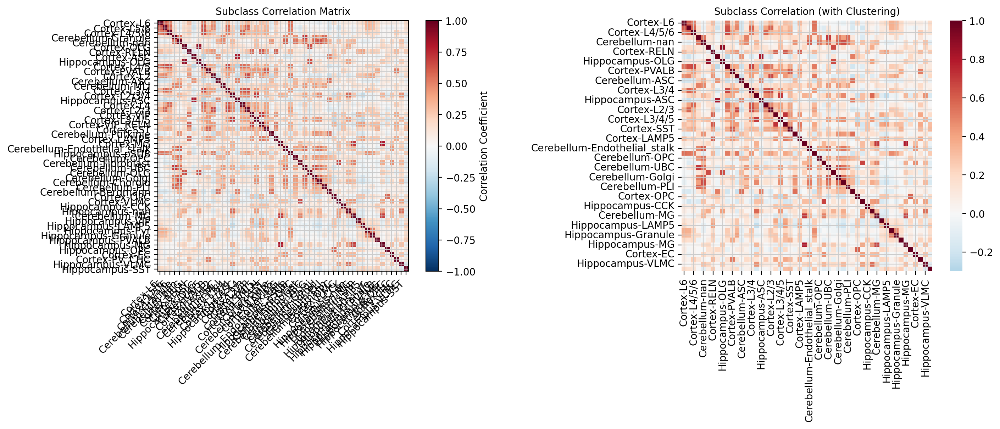

Subclass相关性统计:
平均相关性: 0.126
最大相关性: 0.875
最小相关性: -0.300


In [38]:
# 计算每个subclass的平均表达谱
subclass_means = pd.DataFrame(index=adata.var_names, 
                             columns=adata.obs['subclass2'].unique())

for subclass in adata.obs['subclass2'].unique():
    subclass_cells = adata.obs['subclass2'] == subclass
    subclass_means[subclass] = np.array(adata[subclass_cells].X.mean(axis=0)).flatten()

# 计算subclass间的相关性矩阵
correlation_matrix = subclass_means.corr(method='spearman')

# 可视化相关性热图
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# 相关性热图
im = axes[0].imshow(correlation_matrix, cmap='RdBu_r', vmin=-1, vmax=1)
axes[0].set_xticks(range(len(correlation_matrix.columns)))
axes[0].set_yticks(range(len(correlation_matrix.index)))
axes[0].set_xticklabels(correlation_matrix.columns, rotation=45, ha='right')
axes[0].set_yticklabels(correlation_matrix.index)
axes[0].set_title('Subclass Correlation Matrix')

# 添加颜色条
cbar = plt.colorbar(im, ax=axes[0], fraction=0.046)
cbar.set_label('Correlation Coefficient')

# 添加数值标注
# for i in range(len(correlation_matrix)):
#     for j in range(len(correlation_matrix)):
#         axes[0].text(j, i, f'{correlation_matrix.iloc[i, j]:.2f}', 
#                     ha='center', va='center', fontsize=8)

# 层次聚类热图
sns.heatmap(correlation_matrix, 
            annot=False, 
            cmap='RdBu_r', 
            center=0,
            square=True,
            ax=axes[1])
axes[1].set_title('Subclass Correlation (with Clustering)')

plt.tight_layout()
plt.show()


# 打印相关性统计
print("Subclass相关性统计:")
print(f"平均相关性: {correlation_matrix.values[np.triu_indices_from(correlation_matrix, k=1)].mean():.3f}")
print(f"最大相关性: {correlation_matrix.values[np.triu_indices_from(correlation_matrix, k=1)].max():.3f}")
print(f"最小相关性: {correlation_matrix.values[np.triu_indices_from(correlation_matrix, k=1)].min():.3f}")

<Figure size 1000x800 with 0 Axes>

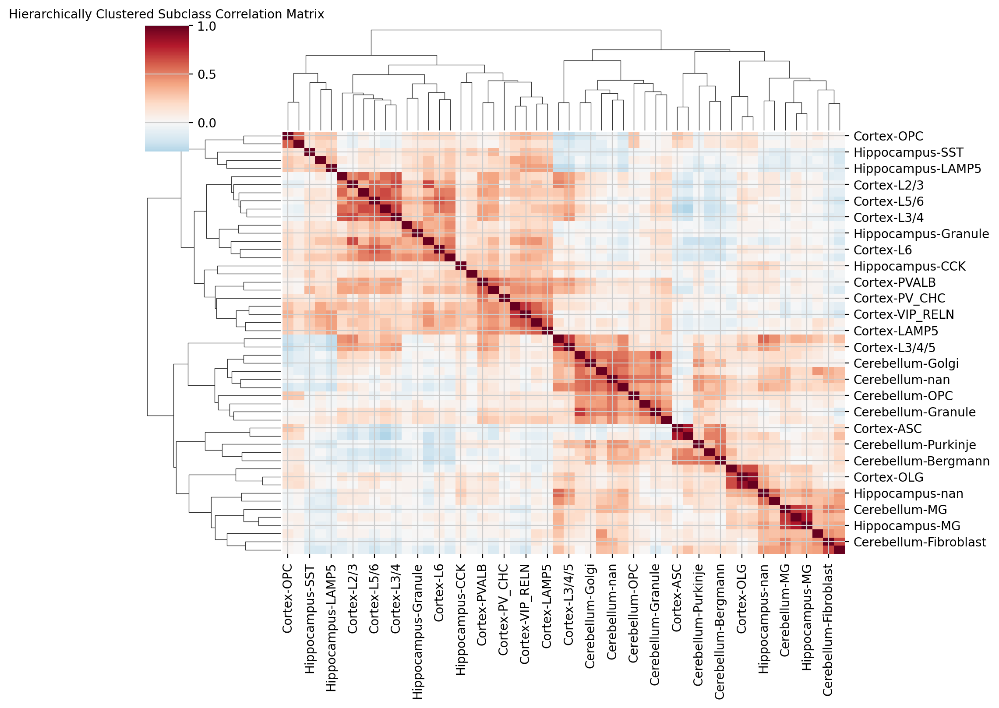

In [37]:
# 使用seaborn的clustermap进行层次聚类可视化
plt.figure(figsize=(10, 8))
sns.clustermap(correlation_matrix, 
               annot=False, 
               cmap='RdBu_r', 
               center=0,
               figsize=(10, 8))
plt.title('Hierarchically Clustered Subclass Correlation Matrix')
plt.show()


In [72]:
adata.obs['subclass2'].cat.categories

Index(['Cerebellum-ASC', 'Cerebellum-Bergmann', 'Cerebellum-Choroid',
       'Cerebellum-Endothelial_stalk', 'Cerebellum-Fibroblast',
       'Cerebellum-Golgi', 'Cerebellum-Granule', 'Cerebellum-MG',
       'Cerebellum-MLI', 'Cerebellum-OLG', 'Cerebellum-OPC', 'Cerebellum-PLI',
       'Cerebellum-Purkinje', 'Cerebellum-UBC', 'Cortex-ASC', 'Cortex-EC',
       'Cortex-L2', 'Cortex-L2/3', 'Cortex-L2/3/4', 'Cortex-L3/4',
       'Cortex-L3/4/5', 'Cortex-L4', 'Cortex-L4/5', 'Cortex-L4/5/6',
       'Cortex-L5/6', 'Cortex-L6', 'Cortex-LAMP5', 'Cortex-MG', 'Cortex-OLG',
       'Cortex-OPC', 'Cortex-PVALB', 'Cortex-PV_CHC', 'Cortex-RELN',
       'Cortex-SST', 'Cortex-VIP', 'Cortex-VIP_RELN', 'Cortex-VLMC',
       'Hippocampus-ASC', 'Hippocampus-CCK', 'Hippocampus-Granule',
       'Hippocampus-LAMP5', 'Hippocampus-MG', 'Hippocampus-OLG',
       'Hippocampus-OPC', 'Hippocampus-PVALB', 'Hippocampus-Pyr',
       'Hippocampus-SST', 'Hippocampus-VIP', 'Hippocampus-VLMC',
       'Hippocampus-pSUB'],
  

{'heatmap_ax': <Axes: >,
 'groupby_ax': <Axes: ylabel='subclass2'>,
 'dendrogram_ax': <Axes: >,
 'gene_groups_ax': <Axes: >}

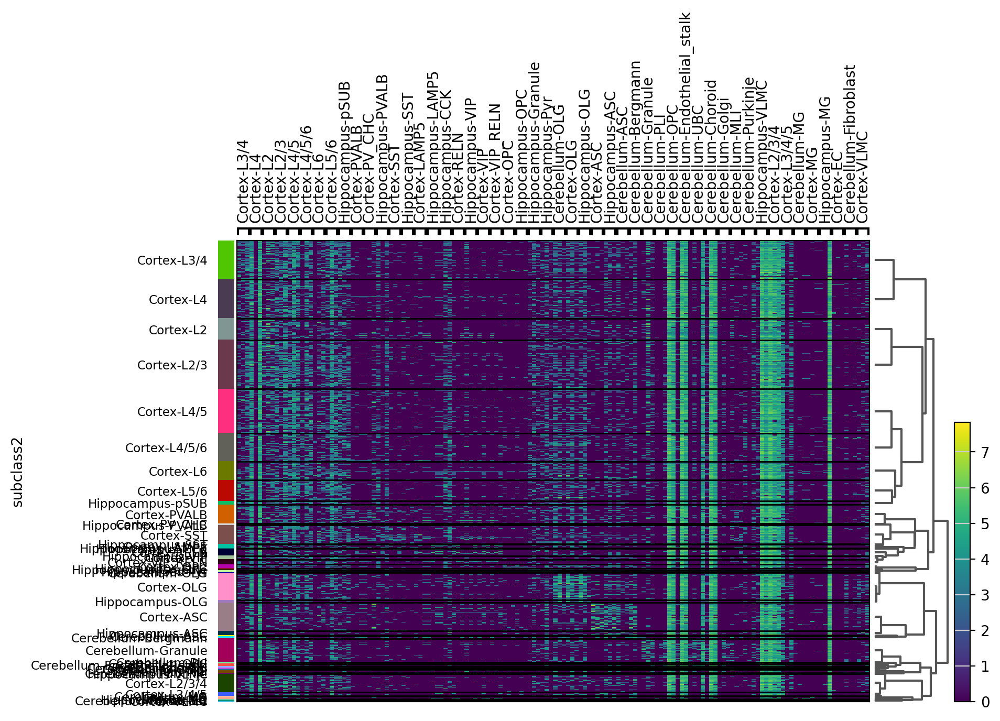

In [76]:
# 每个聚类的top marker基因热图
sc.tl.rank_genes_groups(adata, 'subclass2', method='wilcoxon')
sc.pl.rank_genes_groups_heatmap(adata, 
                               groups=adata.obs['subclass2'].cat.categories, 
                               n_genes=3, 
                               show=False)

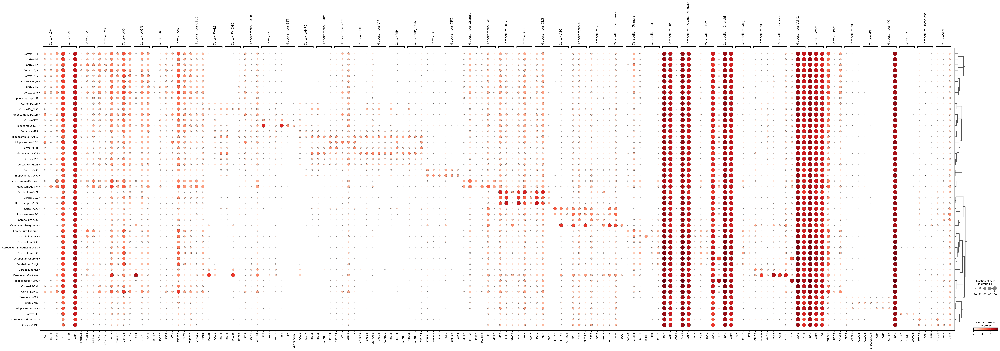

In [81]:
sc.pl.rank_genes_groups_dotplot(adata, 
                               n_genes=3,
                               show=False)
plt.savefig('../result/figure_revision/total_cell_withcrossregion_markergene_shown_25_10_30.pdf')

In [85]:
result_dict = adata.uns['rank_genes_groups']
groups = result_dict['names'].dtype.names
all_genes = []
for group in groups:
    top_genes_for_group = result_dict['names'][group][:3] # 提取每个簇的前3个基因
    all_genes.extend(top_genes_for_group)

# 使用字典去重，保持基因第一次出现的顺序
unique_genes_list = list(dict.fromkeys(all_genes))


['CST3',
 'GFAP',
 'S100B',
 'SLC1A3',
 'APOE',
 'LCAT',
 'TTR',
 'COX3',
 'ATP6',
 'ZIC1',
 'PTGDS',
 'OGN',
 'PTN',
 'LGI2',
 'CHGB',
 'KCND2',
 'KCNIP4',
 'CD74',
 'CSF1R',
 'PLXDC2',
 'GRID2',
 'PVALB',
 'GAD1',
 'MBP',
 'PLP1',
 'CDR1',
 'KLHL1',
 'PCP4',
 'PCP2',
 'ALDOC',
 'CBLN1',
 'COX2',
 'SLC1A2',
 'ADGRV1',
 'ATP10A',
 'CGNL1',
 'MECOM',
 'LRRTM4',
 'RBFOX1',
 'OLFM1',
 'CAMK2N1',
 'CALM2',
 'ND4',
 'CCK',
 'LMO4',
 'CHN1',
 'SNAP25',
 'NEFM',
 'VSNL1',
 'ND1',
 'RORB',
 'TMSB10',
 'STMN1',
 'SYT1',
 'KRT17',
 'ROBO2',
 'RGS4',
 'SGCZ',
 'ERBB4',
 'ST6GALNAC3',
 'A2M',
 'QDPR',
 'PTPRZ1',
 'LHFPL3',
 'SOX6',
 'DPP10',
 'CXCL14',
 'ADARB2',
 'SST',
 'GRIK1',
 'GNAS',
 'NELL2',
 'PPP3CA',
 'PPFIA2',
 'MOBP',
 'ATP1B1',
 'MAPK10',
 'CPE',
 'NPY',
 'CENPS-CORT',
 'CNTNAP2',
 'DYNLL1',
 'MAP1B']

In [83]:
top_3_genes_per_cluster.to_csv('../result/figure_revision/total_cell_withcrossregion_markergene_per_cluster.csv')

In [48]:
adata = adata[adata.obs['subclass2'] != 'Hippocampus-nan', :]
adata = adata[adata.obs['subclass2'] != 'Cerebellum-nan', :]
adata.write_h5ad('/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_single_cell_withcross_25_10_30.h5ad')

In [87]:
adata.write_h5ad('/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_single_cell_withcross_25_10_30.h5ad')

In [2]:
adata = sc.read('/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_single_cell_withcross_25_10_30.h5ad')

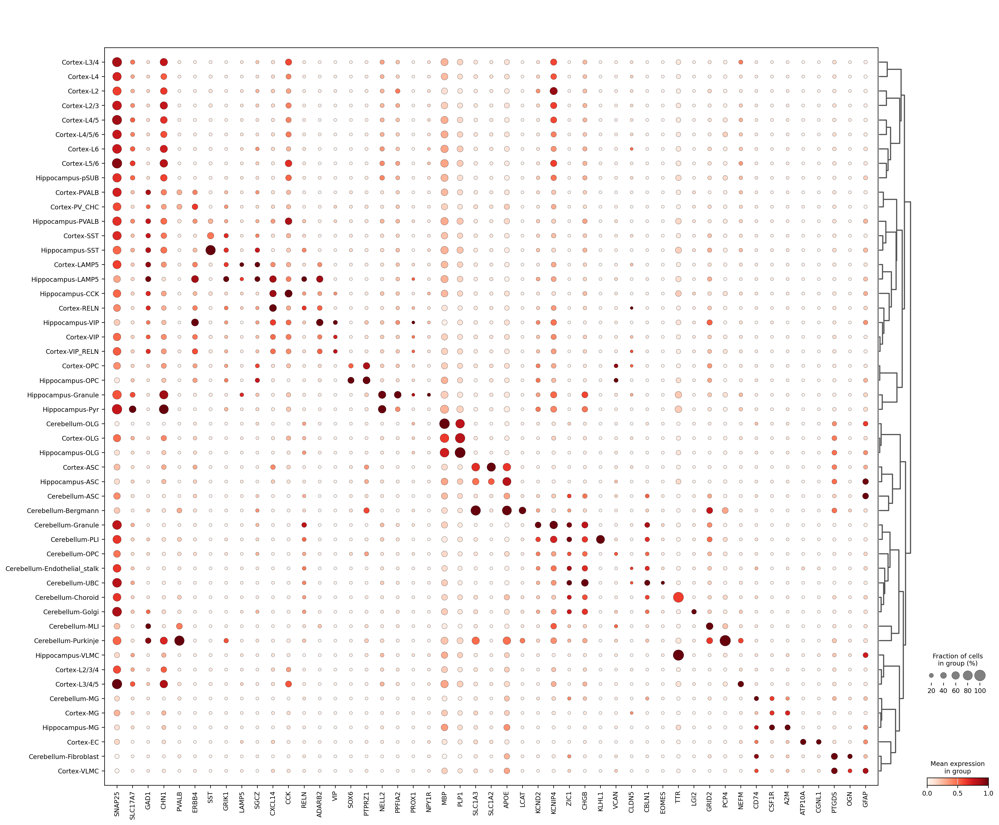

In [122]:
#sc.tl.dendrogram(adata, groupby='subclass2')
geneorder = ['SNAP25','SLC17A7','GAD1','CHN1','PVALB','ERBB4','SST','GRIK1','LAMP5','SGCZ','CXCL14','CCK','RELN','ADARB2',
            'VIP','SOX6','PTPRZ1',
             'NELL2','PPFIA2','PROX1','NPY1R',
             'MBP','PLP1','SLC1A3','SLC1A2','APOE','LCAT',
             'KCND2','KCNIP4',
             'ZIC1','CHGB','KLHL1','VCAN',
             #'CSPG4','OLIG2','PDGFRA','FLT1', 
             'CLDN5','CBLN1','EOMES',
             'TTR','LGI2','GRID2','PCP4','NEFM',
             'CD74','CSF1R','A2M','ATP10A','CGNL1','PTGDS','OGN','GFAP']
sc.pl.dotplot(adata, groupby = "subclass2",
              var_names=geneorder,standard_scale='var',
              smallest_dot=15,
              dendrogram=True,show = False)
plt.savefig('../result/figure_revision/total_cell_withcrossregion_markergene_selected_shown_25_10_30.pdf')

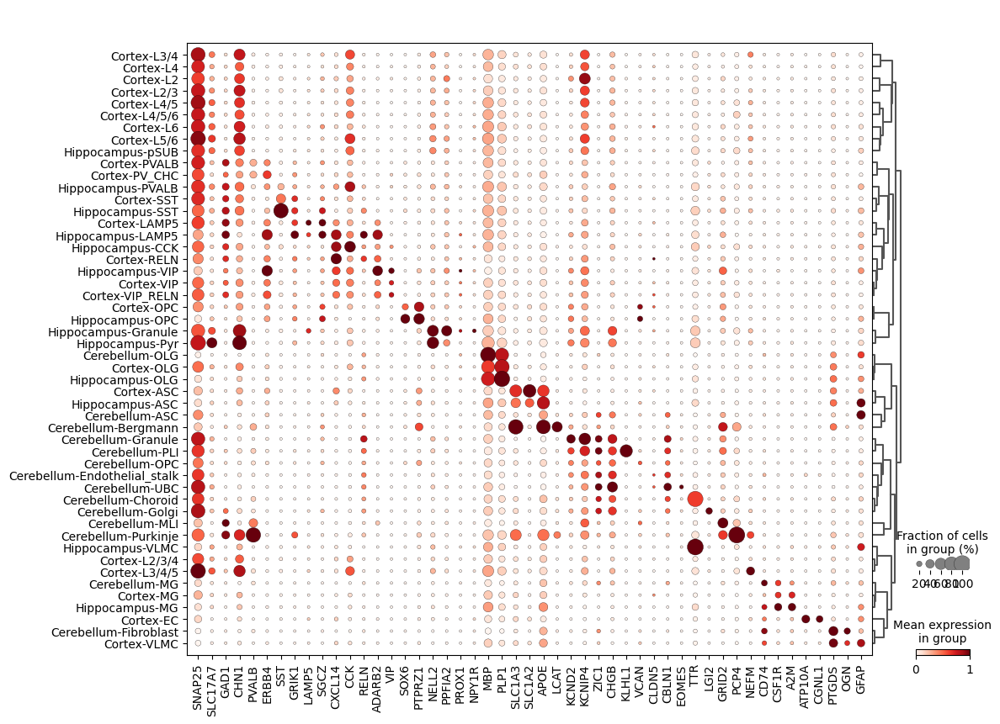

In [10]:
import scanpy as sc
import matplotlib.pyplot as plt

# 在创建图表前，先设置图形大小（宽度, 高度）
plt.figure(figsize=(12, 10))  # 约等于四分之一A4纸的英寸尺寸
import seaborn as sns

# 创建一个上下文设置，重点调整字体大小
context_settings = {
    'font.size': 12,          # 设置基础字体大小
    'xtick.labelsize': 12,    # 设置X轴刻度标签字体大小
    'ytick.labelsize': 12,    # 设置Y轴刻度标签字体大小
    'axes.labelsize': 12,     # 设置坐标轴标签字体大小
    'legend.title_fontsize': 12, # 设置图例标题字体大小
    'legend.fontsize': 12     # 设置图例项字体大小，可略小于基础大小
}

# 应用设置
sns.set_context(context_settings)
# 您的数据处理和绘图代码
# sc.tl.dendrogram(adata, groupby='subclass2')  # 如果尚未计算，可能需要取消注释
geneorder = ['SNAP25','SLC17A7','GAD1','CHN1','PVALB','ERBB4','SST','GRIK1','LAMP5','SGCZ','CXCL14','CCK','RELN','ADARB2',
            'VIP','SOX6','PTPRZ1',
             'NELL2','PPFIA2','PROX1','NPY1R',
             'MBP','PLP1','SLC1A3','SLC1A2','APOE','LCAT',
             'KCND2','KCNIP4',
             'ZIC1','CHGB','KLHL1','VCAN',
             #'CSPG4','OLIG2','PDGFRA','FLT1', 
             'CLDN5','CBLN1','EOMES',
             'TTR','LGI2','GRID2','PCP4','NEFM',
             'CD74','CSF1R','A2M','ATP10A','CGNL1','PTGDS','OGN','GFAP']

# 创建点图，并关键的一步：通过 `ax` 参数将其绘制到我们已设定尺寸的图上
dot_plot = sc.pl.dotplot(adata, groupby = "subclass2",
              var_names=geneorder,
              standard_scale='var',
              smallest_dot=5, 
              dendrogram=True,
              show=False,  # 重要：不立即显示，以便我们进一步操作或直接保存
              ax=plt.gca()  # 获取当前设置的坐标轴，确保图形使用我们定义的大小
             )

plt.savefig('../result/figure_revision/total_cell_withcrossregion_markergene_selected_shown_25_11_10.pdf', 
            bbox_inches='tight')  # bbox_inches='tight' 可以自动裁剪空白边缘

## LME model

In [1]:
library(lme4)
library(dplyr)
library(qs)
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
MySplit = function(str,sep, n){
  return(unlist(lapply(strsplit(str,sep),"[[",n)))
}

Warning message:
“package ‘lme4’ was built under R version 4.3.3”
Loading required package: Matrix

Warning message:
“package ‘Matrix’ was built under R version 4.3.2”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


qs 0.25.5



In [2]:
transt = qread(file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")
transt$subcortical = MySplit(transt$areatr,"-",1)
transt$class = MySplit(transt$areatr,"-",2)
transt$subclass = MySplit(transt$areatr,"-",3)
#unique(transt[,c("class","subclass")])
transt[transt$class != "NonNeuron",]$subclass = transt[transt$class != "NonNeuron",]$class
transt = transt %>% group_by(subclass,subcortical,gene_id,transcript_id) %>% 
            summarise(count = sum(count),genecount = sum(genecount),relative = count/genecount)
#head(transt)
transtf = transt %>% group_by(subcortical,gene_id) %>% 
      filter(length(unique(transcript_id))>1)
transtf = transtf[transtf$count > 10,]
transtf = transtf %>% group_by(subclass,transcript_id) %>% 
       filter(length(unique(subcortical)) > 1)
# #transtf = transtf[paste0(transtf$subclass,transtf$layer) %in% paste0(substf$subclass,substf$layer),]
# transtf = transtf %>% group_by(gene_id,transcript_id,class,subcortical) %>% summarise(count = sum(count),
#                                                                                       genecount = sum(genecount),
#                                                                                      relative = count/genecount)
transtf = transtf %>% group_by(gene_id,transcript_id,subclass) %>% mutate(cellm = sum(count)/sum(genecount))
transtf = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% mutate(subcortm = sum(count)/sum(genecount))

`summarise()` has grouped output by 'subclass', 'subcortical', 'gene_id'. You
can override using the `.groups` argument.


In [4]:
glmer(relative ~  cellm + subcortm + (1|count),
                            family = binomial(),
                            data = transtf[transtf$gene_id == unique(transtf$gene_id)[1],],
                            na.action = na.exclude)

Warning message in eval(family$initialize, rho):
“non-integer #successes in a binomial glm!”
boundary (singular) fit: see help('isSingular')



Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: relative ~ cellm + subcortm + (1 | count)
   Data: transtf[transtf$gene_id == unique(transtf$gene_id)[1], ]
     AIC      BIC   logLik deviance df.resid 
  8.0000   9.9396   0.0000   0.0000        8 
Random effects:
 Groups Name        Std.Dev.
 count  (Intercept) 0       
Number of obs: 12, groups:  count, 11
Fixed Effects:
(Intercept)        cellm     subcortm  
     -45.72        71.44        56.67  
optimizer (Nelder_Mead) convergence code: 0 (OK) ; 0 optimizer warnings; 1 lme4 warnings 

In [7]:
colnames(modelcoef2)[4] = "pvalue"
modelcoef2[modelcoef2$pvalue < 0.05,]

,Estimate,Std. Error,z value,pvalue,gene_id,areatr
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
(Intercept)27,-21.506563,8.771677,-2.451819,1.421362e-02,CCNI,(Intercept)
(Intercept)30,-9.562354,3.302569,-2.895429,3.786403e-03,CFL1,(Intercept)
(Intercept)57,-21.617996,8.479421,-2.549466,1.078880e-02,FKBP2,(Intercept)
cellm105,69.245709,34.592919,2.001731,4.531370e-02,LOC102141554,cellm
(Intercept)135,-34.661159,14.977075,-2.314281,2.065232e-02,NDUFS7,(Intercept)
subcortm135,47.809277,23.042962,2.074789,3.800612e-02,NDUFS7,subcortm
(Intercept)142,-12444.033411,1305.425073,-9.532553,1.534623e-21,NTRK2,(Intercept)
cellm142,35600.878924,3734.829866,9.532129,1.540906e-21,NTRK2,cellm
(Intercept)186,-47.472501,20.486447,-2.317264,2.048937e-02,RPSA,(Intercept)


In [8]:
qsave(modelcoef2,"data/dtu_analysis/subcortical_subclass_isoform_model_tri_onlyregion_25_10_31.qs")

In [ ]:
library(reshape2)
head(transt)
transt$subcortical = MySplit(transt$areatr,"-",1)
transt$class = MySplit(transt$areatr,"-",2)
transt$subclass = MySplit(transt$areatr,"-",3)
unique(transt$subclass)
transtf = transt %>% group_by(subclass,gene_id) %>% 
      filter(length(unique(transcript_id))>1)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
transtf = transtf[transtf$count > 10,] 
transtf = transtf %>% group_by(subclass,transcript_id) %>% 
       filter(length(unique(subcortical)) > 1)
#transtf = transtf[paste0(transtf$subclass,transtf$layer) %in% paste0(substf$subclass,substf$layer),]
transtf = transtf %>% group_by(gene_id,transcript_id,subclass) %>% mutate(cellm = sum(count)/sum(genecount))
transtf = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% mutate(subcortm = sum(count)/sum(genecount))
isosiggl = dcast(transtf,gene_id+transcript_id+subclass~subcortical,value.var = "relative",fun.aggregate = sum)
head(isosiggl)

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,subcortical,class,subclass
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
A4GALT,XM_015457101.1,Cerebellum-GLU-Granule,1,1,1.0,0.96875,0.9666667,0.03333333,Cerebellum,GLU,Granule
A4GALT,XM_015457101.1,Cerebellum-GLU-UBC,2,2,1.0,0.96875,0.9666667,0.03333333,Cerebellum,GLU,UBC
A4GALT,XM_015457101.1,Cerebellum-NonNeuron-Bergmann,1,1,1.0,0.96875,0.9666667,0.03333333,Cerebellum,NonNeuron,Bergmann
A4GALT,XM_015457101.1,Cerebellum-NonNeuron-Fibroblast,1,1,1.0,0.96875,0.9666667,0.03333333,Cerebellum,NonNeuron,Fibroblast
A4GALT,XM_015457101.1,Cortex-GABA-RELN,2,4,0.5,0.96875,1.0000000,-0.50000000,Cortex,GABA,RELN
A4GALT,XM_015457101.1,Cortex-GABA-SST,1,1,1.0,0.96875,0.9666667,0.03333333,Cortex,GABA,SST


[1] "Granule"           "UBC"               "Bergmann"         
 [4] "Fibroblast"        "RELN"              "SST"              
 [7] "VIP_RELN"          "L2"                "L2/3"             
[10] "L2/3/4"            "L4"                "L4/5"             
[13] "L5/6"              "L6"                "MG"               
[16] "VLMC"              "PVALB"             "L3/4"             
[19] "L4/5/6"            "ASC"               "OLG"              
[22] "MLI"               "Endothelial_stalk" "Purkinje"         
[25] "OPC"               "LAMP5"             "L3/4/5"           
[28] "pSUB"              "Golgi"             "PLI"              
[31] "PV_CHC"            "VIP"               "EC"               
[34] "CCK"               "Pyr"               "Choroid"

In [ ]:

library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

p2 = ggtern(data=isosiggl,aes(Cerebellum,Cortex,Hippocampus)) + 
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
    geom_Lline(Lintercept=0.50,color="#14213d") +
    geom_Tline(Tintercept=0.50,color="#14213d") +
    geom_Rline(Rintercept=0.50,color="#14213d") +
    scale_fill_viridis() +
    theme(legend.position = "top")
p2


## Mouse C12 transfer tilgner

In [4]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import warnings
warnings.filterwarnings('ignore')
gemdf = pd.read_csv("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/C03542C6.cellbin.gem", sep="\t",comment='#')  
gemdf

,geneID,x,y,MIDCount,ExonCount,CellID
0,Gm42418,12158,19509,1,1,70312
1,Gm42418,12159,19509,1,1,70312
2,Nsun2,12155,19510,2,2,70312
3,Gm42418,12157,19510,1,1,70312
4,Nap1l1,12158,19510,2,0,70312
...,...,...,...,...,...,...
16735545,Nme1,8105,14261,2,2,42042
16735546,Uba2,8106,14261,1,1,42042
16735547,Capzb,8106,14261,1,1,42042
16735548,Gm42418,8107,14261,1,1,42042


#### Make tilgner scRNA ref

In [6]:
def gem_to_anndata(df, output_h5ad_path=None):
    """
    将GEM格式的空间转录组数据转换为AnnData对象
    
    参数:
    gem_file_path: GEM格式文件的路径
    output_h5ad_path: 输出h5ad文件的路径（可选）
    
    返回:
    AnnData对象
    """
    print(f"数据形状: {df.shape}")
    print(f"基因数: {df['geneID'].nunique()}")
    print(f"细胞数: {df['CellID'].nunique()}")
    print(f"空间位置数: {df[['x', 'y']].drop_duplicates().shape[0]}")
    
    # 3. 构建表达矩阵
    # 按细胞和基因聚合计数（通常使用MIDCount或ExonCount）
    # 这里使用MIDCount作为表达量
    print("\n正在构建表达矩阵...")
    
    # 创建细胞-基因表达矩阵
    expression_matrix = df.pivot_table(
        index='CellID',
        columns='geneID',
        values='MIDCount', 
        aggfunc='sum',
        fill_value=0
    )
    
    # 转换为稀疏矩阵以节省内存
    sparse_matrix = csr_matrix(expression_matrix.values)
    
    # 4. 创建AnnData对象
    print("正在创建AnnData对象...")
    
    # 创建观察（细胞）的元数据
    obs = pd.DataFrame(index=expression_matrix.index)
    obs.index.name = 'CellID'
    
    # 添加细胞的空间坐标信息
    # 获取每个细胞的平均坐标
    cell_coords = df.groupby('CellID')[['x', 'y']].mean()
    obs = obs.join(cell_coords)
    
    # 添加其他细胞级别的统计信息
    obs['total_counts'] = expression_matrix.sum(axis=1).values
    obs['n_genes_by_counts'] = (expression_matrix > 0).sum(axis=1).values
    
    var = pd.DataFrame(index=expression_matrix.columns)
    var.index.name = 'geneID'

    var['n_cells_by_counts'] = (expression_matrix > 0).sum(axis=0).values
    var['total_counts'] = expression_matrix.sum(axis=0).values
    var['mean_counts'] = expression_matrix.mean(axis=0).values
    
    # 创建AnnData对象
    adata = ad.AnnData(
        X=sparse_matrix,
        obs=obs,
        var=var,
        dtype=sparse_matrix.dtype
    )
    
    # 5. 添加空间坐标到obsm
    spatial_coords = obs[['x', 'y']].values
    adata.obsm['spatial'] = spatial_coords
    
    # 7. 基本质量控制
    print("\n执行基本质量控制...")
    
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    
    # 8. 保存结果
    if output_h5ad_path:
        print(f"正在保存到: {output_h5ad_path}")
        adata.write_h5ad(output_h5ad_path)
        print("保存完成!")
    
    return adata

adata = gem_to_anndata(gemdf, "/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/C03542C6.cellbin.h5ad")


数据形状: (16735550, 6)
基因数: 23422
细胞数: 70313
空间位置数: 8839901

正在构建表达矩阵...
正在创建AnnData对象...

执行基本质量控制...
正在保存到: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/C03542C6.cellbin.h5ad
保存完成!


In [4]:
import os
import glob
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
from scipy.sparse import vstack, csr_matrix
import warnings
warnings.filterwarnings('ignore')

def load_and_combine_10x_folders(base_dir, output_path=None):
    """
    遍历base_dir下的所有子文件夹，每个子文件夹包含10x格式的三个文件，
    将所有数据合并为一个AnnData对象
    
    参数:
    base_dir: 包含多个子文件夹的基目录
    output_path: 合并后保存的h5ad文件路径（可选）
    
    返回:
    合并后的AnnData对象
    """
    # 1. 查找所有包含10x文件的子文件夹
    print(f"搜索目录: {base_dir}")
    # 查找所有子文件夹
    subfolders = [f.path for f in os.scandir(base_dir) if f.is_dir()]
    if not subfolders:
        # 如果base_dir本身就是包含10x文件的目录
        if all(os.path.exists(os.path.join(base_dir, f)) for f in ['matrix.mtx', 'features.tsv', 'barcodes.tsv']):
            subfolders = [base_dir]
        else:
            raise ValueError(f"在 {base_dir} 中未找到包含10x数据的文件夹")
    
    print(f"找到 {len(subfolders)} 个文件夹")
    
    # 2. 逐个加载每个文件夹的数据
    adata_list = []
    var_consistent = True
    first_var = None
    
    for i, folder in enumerate(subfolders):
        print(f"\n处理文件夹 {i+1}/{len(subfolders)}: {folder}")
        
        # 检查文件夹中是否包含10x文件
        
        
        try:
            # 加载当前文件夹的数据
            adata = sc.read_10x_mtx(
                    path=folder,
                    prefix='',
                    var_names='gene_symbols',
                    make_unique=True,
                    cache=True 
                )
            
            # 添加样本标识符
            sample_name = os.path.basename(folder)
            adata.obs['sample'] = sample_name
            adata.obs['sample_id'] = sample_name
            
            # 修改细胞barcode，添加样本前缀以避免重复
            adata.obs_names = [f"{sample_name}_{barcode}" for barcode in adata.obs_names]
            
            # 检查基因是否一致
            if first_var is None:
                first_var = adata.var_names.tolist()
            else:
                current_var = adata.var_names.tolist()
                if current_var != first_var:
                    print(f"  警告: 文件夹 {folder} 的基因列表与第一个文件夹不一致")
                    var_consistent = False
            
            adata_list.append(adata)
            print(f"  成功加载: {adata.shape[0]} 个细胞, {adata.shape[1]} 个基因")
            
        except Exception as e:
            print(f"  加载失败: {e}")
            continue
    
    if not adata_list:
        raise ValueError("没有成功加载任何数据")
    
    print(f"\n成功加载 {len(adata_list)} 个数据集")
    
    # 3. 合并所有数据集
    print("\n正在合并数据集...")
    
    if var_consistent:
        # 如果所有数据集的基因相同，直接合并
        print("所有数据集的基因列表一致，直接合并")
        adata_combined = ad.concat(adata_list, axis=0, join='outer', label='batch')
    else:
        # 如果基因列表不一致，需要对齐
        print("基因列表不一致，进行对齐合并")
        adata_combined = align_and_merge_adata_list(adata_list)
    
    print(f"合并后数据形状: {adata_combined.shape[0]} 个细胞, {adata_combined.shape[1]} 个基因")
    
    # 4. 添加基本QC指标
    print("\n计算质量控制指标...")
    adata_combined.obs['n_counts'] = adata_combined.X.sum(axis=1).A1
    adata_combined.obs['n_genes_by_counts'] = (adata_combined.X > 0).sum(axis=1).A1
    
    # 5. 保存结果
    if output_path:
        print(f"\n保存合并数据到: {output_path}")
        adata_combined.write_h5ad(output_path)
    
    return adata_combined

def align_and_merge_adata_list(adata_list):
    """
    对齐并合并多个AnnData对象（当基因列表不一致时）
    """
    # 获取所有数据集中出现的所有基因
    all_genes = set()
    for adata in adata_list:
        all_genes.update(adata.var_names)
    
    all_genes = sorted(list(all_genes))
    print(f"  所有数据集中共有 {len(all_genes)} 个唯一基因")
    
    # 为每个数据集重新排列基因顺序，缺失的基因用0填充
    aligned_matrices = []
    aligned_var = pd.DataFrame(index=all_genes)
    aligned_var.index.name = 'gene_symbol'
    
    for i, adata in enumerate(adata_list):
        # 创建基因到列的映射
        gene_to_idx = {gene: idx for idx, gene in enumerate(adata.var_names)}
        
        # 创建新的矩阵
        n_cells = adata.shape[0]
        n_genes = len(all_genes)
        
        # 获取原始稀疏矩阵
        X_original = adata.X
        
        # 创建新的稀疏矩阵
        row_indices = []
        col_indices = []
        data = []
        
        # 遍历原始矩阵的非零元素
        if hasattr(X_original, 'tocoo'):
            X_coo = X_original.tocoo()
            for row, col, val in zip(X_coo.row, X_coo.col, X_coo.data):
                gene = adata.var_names[col]
                if gene in all_genes:
                    new_col = all_genes.index(gene)
                    row_indices.append(row)
                    col_indices.append(new_col)
                    data.append(val)
        
        # 创建新的稀疏矩阵
        X_aligned = csr_matrix((data, (row_indices, col_indices)), shape=(n_cells, n_genes))
        
        aligned_matrices.append(X_aligned)
    
    # 垂直堆叠所有矩阵
    X_combined = vstack(aligned_matrices, format='csr')
    # 合并观察信息
    obs_combined = pd.concat([adata.obs for adata in adata_list], ignore_index=True)
    # 创建合并后的AnnData对象
    adata_combined = ad.AnnData(
        X=X_combined,
        obs=obs_combined,
        var=aligned_var,
        dtype=X_combined.dtype
    )
    
    return adata_combined


In [5]:
base_directory = "/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner"
output_file = "/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_adata.h5ad"

try:
        # 加载并合并数据
    combined_adata = load_and_combine_10x_folders(
        base_dir=base_directory,
        output_path=output_file
    )
        
        # 打印合并后的统计信息
    print("\n" + "="*60)
    print("合并数据统计信息")
    print("="*60)
    print(f"总细胞数: {combined_adata.n_obs}")
    print(f"总基因数: {combined_adata.n_vars}")
        
        # 按样本统计
    print("\n各样本细胞数量:")
    sample_counts = combined_adata.obs['sample'].value_counts()
    for sample, count in sample_counts.items():
        print(f"  {sample}: {count} 个细胞")
        
        # 基本统计
    print(f"\n平均每个细胞总计数: {combined_adata.obs['n_counts'].mean():.0f}")
    print(f"平均每个细胞检测基因数: {combined_adata.obs['n_genes_by_counts'].mean():.0f}")
        
        # 显示前几行
    print("\n前5个细胞:")
    print(combined_adata.obs.head())
        
    print("\n前5个基因:")
    print(combined_adata.var.head())
        
except Exception as e:
    print(f"处理失败: {e}")

搜索目录: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner
找到 9 个文件夹

处理文件夹 1/9: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/P56_M5_TH
  成功加载: 16145 个细胞, 31053 个基因

处理文件夹 2/9: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/P56_M1_CB
  成功加载: 3870 个细胞, 31053 个基因

处理文件夹 3/9: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/P56_M9_VIS
  成功加载: 9564 个细胞, 31053 个基因

处理文件夹 4/9: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/P56_M1_STR
  成功加载: 8206 个细胞, 31053 个基因

处理文件夹 5/9: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/P56_M1_HIP
  成功加载: 6906 个细胞, 31053 个基因

处理文件夹 6/9: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/P56_M8_VIS
  成功加载: 4733 个细胞, 31053 个基因

处理文件夹 7/9: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/P56_M2_STR
  成功加载: 7550 个细胞, 31053 个基因

处理文件夹 8/9: /cluster/home/liuhengxin/P_fullscope_crosspecies/data/re

In [6]:
cellan = pd.read_csv("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/ref/biccn_tilgner_scisorseq/data/SR_fullData_combined_barcodeCTassignments",
                     sep="\t",header=None,names=['barcode', 'annotation'])
region_mapping = {
        'Cerebellum': 'CB',
        'Striatum': 'STR', 
        'Thalamus': 'TH',
        'Hippocampus': 'HIP',
        'VisCortex': 'VIS'
    }

def extract_sample_id_from_annotation(annotation_str):
    if '::' not in annotation_str:
        return None
        
    parts = annotation_str.split('::')
    if len(parts) < 3:
        return None
        
        # 提取前三个部分：年龄、小鼠编号、脑区
    age_mouse = parts[0]  # 如 "P56"
    mouse_id = parts[1]   # 如 "M1"
    region_full = parts[2]  # 如 "Cerebellum"
        
        # 将完整脑区名称转换为缩写
    region_abbr = region_mapping.get(region_full, region_full)
        
        # 构建样本ID：P56_M1_CB
    sample_id = f"{age_mouse}_{mouse_id}_{region_abbr}"
    return sample_id
    
    # 4. 应用转换函数
cellan['sample_id_converted'] = cellan['annotation'].apply(extract_sample_id_from_annotation)
# cellan['new_barcode'] = cellan['sample_id_converted'] + "_" + cellan['new_barcode'] + "-1"
cellan['full_barcode'] = cellan.apply(
        lambda row: f"{row['sample_id_converted']}_{row['barcode']}-1" 
        if row['sample_id_converted'] else None,
        axis=1
    )

barcode_to_annotation = dict(zip(cellan['full_barcode'], cellan['annotation']))
combined_adata.obs["annotation"] = combined_adata.obs.index.map(barcode_to_annotation)
matched_count = combined_adata.obs["annotation"].notna().sum()
total_cells = combined_adata.shape[0]
print(f"注释匹配情况: {matched_count}/{total_cells} 个细胞成功匹配")
combined_adata.write("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_adata_processed.h5ad")

注释匹配情况: 66647/78928 个细胞成功匹配


In [33]:
filtered_adata.obs['sample_id'].unique()

['P56_M5_TH', 'P56_M1_CB', 'P56_M9_VIS', 'P56_M1_STR', 'P56_M1_HIP', 'P56_M8_VIS', 'P56_M2_STR', 'P56_M2_CB', 'P56_M6_TH']
Categories (9, object): ['P56_M1_CB', 'P56_M1_HIP', 'P56_M1_STR', 'P56_M2_CB', ..., 'P56_M5_TH', 'P56_M6_TH', 'P56_M8_VIS', 'P56_M9_VIS']

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import harmony
combined_adata = sc.read_h5ad("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_adata_processed.h5ad")

In [24]:
mask = combined_adata.obs["annotation"].notna()
filtered_adata = combined_adata[mask, :].copy()

In [29]:
filtered_adata

AnnData object with n_obs × n_vars = 78928 × 31053
    obs: 'sample', 'sample_id', 'batch', 'n_counts', 'n_genes_by_counts', 'annotation'

In [35]:
import pandas as pd
import numpy as np
import scipy.sparse as sp
from scipy import io
os.chdir("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_mtx/")
# 假设 adata 是你的 AnnData 对象
# adata = ad.read_h5ad("your_file.h5ad")
import anndata as ad
import pandas as pd
from scipy.io import mmwrite

# 读取你的 AnnData（或直接使用已有对象）
# adata = ad.read_h5ad("your_file.h5ad")
adata = filtered_adata
# 导出表达矩阵（稀疏格式）
if sp.issparse(adata.X):
    # 保存为稀疏矩阵
    io.mmwrite('matrix.mtx', adata.X)
else:
    # 如果是稠密矩阵，先转换为稀疏格式
    sparse_matrix = sp.csr_matrix(adata.X)
    io.mmwrite('matrix.mtx', sparse_matrix)

# 导出obs信息
obs_df = adata.obs
obs_df.to_csv('obs_metadata.csv', index=True)  # 保留索引（细胞名）

# 导出var信息（基因信息）
var_df = adata.var
var_df.to_csv('var_features.csv', index=True)  # 保留索引（基因名）

# 导出细胞名和基因名
with open('barcodes.tsv', 'w') as f:
    f.write('\n'.join(adata.obs_names))

with open('genes.tsv', 'w') as f:
    f.write('\n'.join(adata.var_names))

print("导出完成！文件列表：")
print("- matrix.mtx: 表达矩阵")
print("- obs_metadata.csv: 细胞元数据")
print("- var_features.csv: 基因元数据")
print("- barcodes.tsv: 细胞名")
print("- genes.tsv: 基因名")


导出完成！文件列表：
- matrix.mtx: 表达矩阵
- obs_metadata.csv: 细胞元数据
- var_features.csv: 基因元数据
- barcodes.tsv: 细胞名
- genes.tsv: 基因名


In [44]:
#load seurat obj
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
from scipy import io
from scipy.sparse import csr_matrix
import os

# 设置工作目录
os.chdir("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_mtx/seurat/seurat_export")

# 1. 读取Metadata
cell_metadata = pd.read_csv("cell_metadata.csv", index_col=0)

# 2. 读取RNA assay（原始计数）
# 读取mtx文件
counts_rna = io.mmread("rna_counts.mtx").T  # 注意需要转置
counts_rna = csr_matrix(counts_rna)

# 读取基因和细胞名
with open("rna_genes.txt", 'r') as f:
    genes_rna = [x.strip() for x in f.readlines()]
    
with open("rna_barcodes.txt", 'r') as f:
    barcodes_rna = [x.strip() for x in f.readlines()]

counts_rna
cell_metadata
# 2. 读取RNA assay（原始计数）
# 3. 创建AnnData对象（主对象，使用RNA作为基础）
adata = ad.AnnData(X=counts_rna, obs=cell_metadata, var=pd.DataFrame(index=genes_rna))

# 4. 读取integrated assay的数据
# data层（通常是归一化后的数据）
integrated_data = io.mmread("integrated_data.mtx").T
integrated_data = csr_matrix(integrated_data)

with open("integrated_genes.txt", 'r') as f:
    integrated_genes = [x.strip() for x in f.readlines()]
    
with open("integrated_barcodes.txt", 'r') as f:
    integrated_barcodes = [x.strip() for x in f.readlines()]
adata.layers["integrated_data"] = integrated_data
# 5. 读取scale.data（如果有）
if os.path.exists("integrated_scale.mtx"):
    integrated_scale = io.mmread("integrated_scale.mtx").T
    integrated_scale = csr_matrix(integrated_scale)
    adata.layers["integrated_scale"] = integrated_scale

,orig.ident,nCount_RNA,nFeature_RNA,sample,sample_id,batch,n_counts,n_genes_by_counts,annotation,percent.mt,RNA_snn_res.0.5,seurat_clusters
P56_M5_TH_AAACCCAAGGTATAGT-1,P56,8417,2745,P56_M5_TH,P56_M5_TH,0,8417,2745,P56::M5::Thalamus::Glia::Oligo::MFOLs,0,1,1
P56_M5_TH_AAACCCAAGTCGAATA-1,P56,842,507,P56_M5_TH,P56_M5_TH,0,842,507,NaN,0,3,3
P56_M5_TH_AAACCCAAGTTACGGG-1,P56,15545,4806,P56_M5_TH,P56_M5_TH,0,15545,4806,P56::M5::Thalamus::Supportive::Vasc::Endo,0,7,7
P56_M5_TH_AAACCCACAGAGCTAG-1,P56,11568,3627,P56_M5_TH,P56_M5_TH,0,11568,3627,P56::M5::Thalamus::Glia::Oligo::COPs,0,17,17
P56_M5_TH_AAACCCACATGACAAA-1,P56,2207,1138,P56_M5_TH,P56_M5_TH,0,2207,1138,P56::M5::Thalamus::Supportive::Immune::Microglia,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
P56_M6_TH_TTTGTTGTCGGCGATC-1,P56,1581,826,P56_M6_TH,P56_M6_TH,8,1581,826,P56::M6::Thalamus::Glia::Astro::Astrocytes,0,5,5
P56_M6_TH_TTTGTTGTCTATTCGT-1,P56,4066,1787,P56_M6_TH,P56_M6_TH,8,4066,1787,P56::M6::Thalamus::Supportive::Immune::Microglia,0,0,0
P56_M6_TH_TTTGTTGTCTCAATCT-1,P56,12184,4295,P56_M6_TH,P56_M6_TH,8,12184,4295,P56::M6::Thalamus::Supportive::Vasc::Endo,0,37,37
P56_M6_TH_TTTGTTGTCTCCATAT-1,P56,3866,2057,P56_M6_TH,P56_M6_TH,8,3866,2057,P56::M6::Thalamus::Supportive::Vasc::Endo,0,7,7


In [52]:

# 6. 添加Variable Features信息
if os.path.exists("variable_features.txt"):
    with open("variable_features.txt", 'r') as f:
        var_features = [x.strip() for x in f.readlines()]
    
    # 在var中添加标记
    adata.var['highly_variable'] = adata.var.index.isin(var_features)

# 7. 读取降维结果
# PCA
pca_coords = pd.read_csv("pca_coords.csv", index_col=0)
adata.obsm['X_pca'] = pca_coords.values

# UMAP
umap_coords = pd.read_csv("umap_coords.csv", index_col=0)
adata.obsm['X_umap'] = umap_coords.values

# 9. 设置当前活跃的降维结果
adata.uns['pca'] = {'params': {'zero_center': True}}
adata.uns['umap'] = {'params': {'a': 1.57825, 'b': 0.8951}}  # 可以调整

# 10. 验证对象
print(adata)

# 应该输出类似：
# AnnData object with n_obs × n_vars = 78928 × 33053
#     obs: 'nCount_RNA', 'nFeature_RNA', ... (你的metadata列)
#     var: 'highly_variable'
#     uns: 'pca', 'umap'
#     obsm: 'X_pca', 'X_umap'
#     layers: 'integrated_data', 'integrated_scale'

# 检查integrated数据
if "integrated_data" in adata.layers:
    print(f"\nIntegrated data shape: {adata.layers['integrated_data'].shape}")

# 11. 保存为h5ad文件
adata.write_h5ad("seurat_converted.h5ad")

# print("\n✅ 转换完成！已保存为 seurat_converted.h5ad")

AnnData object with n_obs × n_vars = 78928 × 31053
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'sample_id', 'batch', 'n_counts', 'n_genes_by_counts', 'annotation', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters'
    var: 'highly_variable'
    uns: 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    layers: 'integrated_data'

Integrated data shape: (78928, 31053)


In [53]:
adata_sp = sc.read_h5ad("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/C03542C6.cellbin.h5ad")
#adata.write_h5ad("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_mtx/seurat_converted.h5ad")

/cluster/home/liuhengxin/software/miniconda3_2/envs/GraphST/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/GraphST/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/GraphST/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


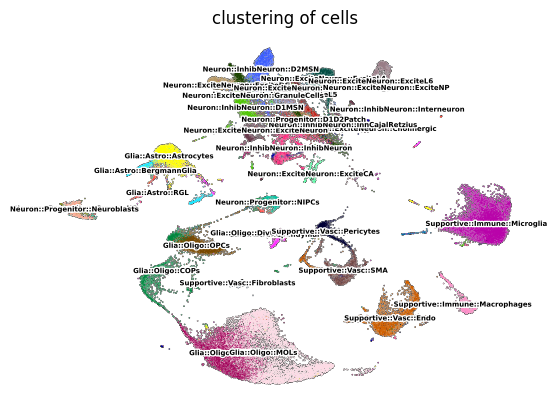

In [19]:
def extract_cell_type_from_annotation(annotation_string):
    if pd.isna(annotation_string):
        return None
    parts = annotation_string.split('::')
    if len(parts) < 4:
        return annotation_string
    if len(parts) == 4:
        return parts[3]
    else:
        return '::'.join(parts[3:])
adata_sc.obs['cell_type'] = adata_sc.obs['annotation'].apply(extract_cell_type_from_annotation)
adata_sc.obs['cell_type'] 
sc.pl.umap(
        adata_sc,
        color="cell_type",
        add_outline=True,
        legend_loc="on data",
        legend_fontsize=5,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells"
    )

In [19]:
counts_rna = io.mmread("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_mtx/seurat/seurat_export/rna_counts.mtx").T
adata_sc = sc.read_h5ad("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_mtx/seurat/seurat_export/seurat_converted.h5ad")
counts_rna = csr_matrix(counts_rna)
adata_sc.layers['counts'] = counts_rna
mask = adata_sc.obs["annotation"].notna()
adata_sc = adata_sc[mask, :].copy()
adata_sc.X = adata_sc.layers['integrated_data']
adata_sc
adata_sc.write_h5ad("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/combined_mtx/seurat_converted.h5ad")

In [ ]:
adata.X = adata.layers['integrated_data']
dnn_train(adata, 
          labels = 'cell_type', 
          hidden_dim = 800, 
          train_percent = 0.8, 
          epoches = 100, 
          batch_size = 4096, 
          learning_rate = 0.01, 
          model_save_path = '/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/mouse_model')



==> Preprocessing...

==> Predataloader...

==> DnnModel...

==> train...
[epoch 1], loss: 3.248558521270752, acc：0.2705926481620405

==> save model...0


/tmp/ipykernel_49618/3092593498.py:92: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model)


{'Glia::Oligo::MOLs', 'Neuron::ExciteNeuron::ExciteCA', 'Neuron::InhibNeuron::Interneuron', 'Glia::Astro::BergmannGlia', 'Supportive::Vasc::Fibroblasts', 'Supportive::Vasc::SMA', 'Neuron::ExciteNeuron::GranuleCells', 'Neuron::InhibNeuron::InhibNeuron', 'Glia::Oligo::MFOLs', 'Supportive::Immune::Macrophages', 'Glia::Astro::Astrocytes', 'Neuron::ExciteNeuron::ExciteL23', 'Neuron::ExciteNeuron::ExciteDG', 'Neuron::InhibNeuron::InhCajalRetzius', 'Supportive::Immune::Microglia', 'Neuron::ExciteNeuron::ExciteL6', 'Neuron::Progenitor::GranuleNB', 'Neuron::Progenitor::NIPCs', 'Neuron::ExciteNeuron::ExciteNP', 'Glia::Astro::Ependymal', 'Glia::Oligo::DivOPCs', 'Neuron::Progenitor::D1D2Patch', 'Glia::Oligo::OPCs', 'Neuron::InhibNeuron::D2MSN', 'Neuron::ExciteNeuron::ExciteNeuron', 'Supportive::Vasc::Pericytes', 'Neuron::Progenitor::Neuroblasts', 'Neuron::ExciteNeuron::ExciteL4', 'Neuron::InhibNeuron::D1MSN', 'Glia::Astro::RGL', 'Supportive::Vasc::Endo', 'Neuron::ExciteNeuron::Cholinergic', 'Neuro

cell_type_annotation_model.py:146: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
cell_type_annotation_model.py:175: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/autocast_mode.py:265: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/nn/functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean

  [Epoch   1] Loss: 236.87077, Time: 78.52 s, Psuedo-Acc: 3.26%
  [Epoch   2] Loss: 279.14685, Time: 157.80 s, Psuedo-Acc: 8.46%
  [Epoch   3] Loss: 204.33914, Time: 236.79 s, Psuedo-Acc: 5.79%
  [Epoch   4] Loss: 176.32773, Time: 316.79 s, Psuedo-Acc: 6.44%
  [Epoch   5] Loss: 146.72287, Time: 394.34 s, Psuedo-Acc: 7.15%
  [Epoch   6] Loss: 126.86101, Time: 473.75 s, Psuedo-Acc: 8.41%
  [Epoch   7] Loss: 106.75731, Time: 552.33 s, Psuedo-Acc: 10.06%
  [Epoch   8] Loss: 95.01694, Time: 633.55 s, Psuedo-Acc: 11.63%
  [Epoch   9] Loss: 87.92096, Time: 714.18 s, Psuedo-Acc: 12.89%
  [Epoch  10] Loss: 82.65135, Time: 793.32 s, Psuedo-Acc: 14.45%
  [Epoch  11] Loss: 79.58707, Time: 871.67 s, Psuedo-Acc: 15.52%
  [Epoch  12] Loss: 77.47052, Time: 950.50 s, Psuedo-Acc: 16.36%
  [Epoch  13] Loss: 74.17409, Time: 1029.88 s, Psuedo-Acc: 17.44%
  [Epoch  14] Loss: 69.79176, Time: 1107.36 s, Psuedo-Acc: 18.62%
  [Epoch  15] Loss: 65.83475, Time: 1185.29 s, Psuedo-Acc: 19.74%
  [Epoch  16] Loss: 62

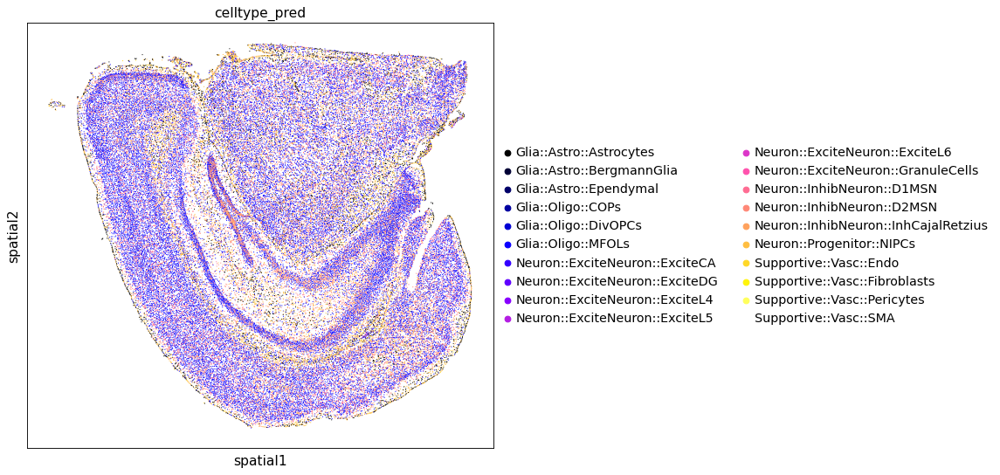

In [85]:

#spatial_adata = sc.read('../spatial/A5.h5ad')
params = {
    'pca_dim': 100,  
    'k_graph': 20,
    'edge_weight': True,
    'kd_T': 3,
    'feat_dim': 1000,
    'w_dae': 10.0,
    'w_gae': 5.0,
    'w_cls': 50.0,
    'epochs': 20,
    'lr': 0.0005,
}

transfer(adata_sp, 
         model = '/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/tilgner/mouse_model_20.dnnmodel', 
         transfer_batchsize = 4096, 
         result_csv = '/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/spsc_transfer_tilgner_echo100.csv', 
         new_adata ='/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/C12L_sptrans.h5ad', 
         device = 'cpu',
         k_graph = 20,
         params = params)

In [ ]:
sc.pl.spatial(adata, img_key=None, color=['celltype_pred'], palette  =  'gnuplot2', spot_size=30, show=True)

### Use C4 mouse scRNA

In [3]:
import scanpy as sc
import os
os.chdir("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/")
adata = sc.read('C12L/C03542C6.cellbin.h5ad')
adata_sc = sc.read('finally_adata_BUCKUP.h5ad')
adata_sc
print(adata_sc)

AnnData object with n_obs × n_vars = 667077 × 27294
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell', 'lib', 'libId', 'sample', 'region_id', 'brain_region', 'type', 'batch', 'percent.mt', 'countFeatureRatio', 'maxPredClass', 'majorPredClass', 'maxPredClassScore', 'seurat_orig.ident', 'seurat_nCount_RNA', 'seurat_nFeature_RNA', 'seurat_cell', 'seurat_lib', 'seurat_libId', 'seurat_sample', 'seurat_region_id', 'seurat_brain_region', 'seurat_type', 'seurat_batch', 'seurat_percent.mt', 'seurat_countFeatureRatio', 'seurat_maxPredClass', 'seurat_majorPredClass', 'seurat_maxPredClassScore', 'seurat_mapmycells_class_name', 'seurat_mapmycells_subclass_name', 'seurat_mapmycells_supertype_name', 'seurat_mapmycells_cluster_name', 'seurat_mapmycells_group', 'seurat_lib_id', 'seurat_mapmycells_class_name2', 'seurat_mapmycells_subclass_name_old', 'seurat_mapmycells_class_name_old', 'seurat_group', 'seurat_750_cluster', 'seurat_cluster_label', 'seurat_ID', 'seurat_big_group', 'seurat_KEEP_RE

In [8]:
adata_sc.obs['seurat_finally_subclass'].unique()

['006 L4/5 IT CTX Glut', '007 L2/3 IT CTX Glut', '030 L6 CT CTX Glut', '004 L6 IT CTX Glut', '049 Lamp5 Gaba', ..., '242 PGRNd Dmbx1 Glut', '091 ARH-PVi Six6 Dopa-Gaba', '178 SCig Foxb1 Otx2 Glut', '180 SCiw Pitx2 Glut', '026 NLOT Rho Glut']
Length: 160
Categories (160, object): ['001 CLA-EPd-CTX Car3 Glut', '002 IT EP-CLA Glut', '003 L5/6 IT TPE-ENT Glut', '004 L6 IT CTX Glut', ..., '332 SMC NN', '333 Endo NN', '334 Microglia NN', '335 BAM NN']

/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:343: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:352: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


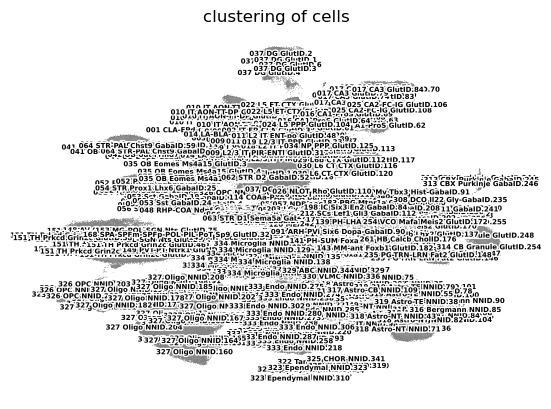

In [7]:
# print(adata_sc)
# sc.pl.umap(
#         adata_sc,
#         color="cluster",
#         add_outline=True,
#         legend_loc="on data",
#         legend_fontsize=12,
#         legend_fontoutline=2,
#         frameon=False,
#         title="clustering of cells",
#         palette="Set1",
#     )
sc.pl.umap(
        adata_sc,
        color="seurat_finally_subclass",
        add_outline=True,
        legend_loc="on data",
        legend_fontsize=5,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells"
    )

In [9]:

dnn_train(adata_sc, 
          labels = 'seurat_finally_subclass', 
          hidden_dim = 800, 
          train_percent = 0.8, 
          epoches = 100, 
          batch_size = 4096, 
          learning_rate = 0.01, 
          model_save_path = '/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/our_backup/mouse_model')



==> Preprocessing...

==> Predataloader...

==> DnnModel...

==> train...
[epoch 1], loss: 2.2043087482452393, acc：0.5011992564609942

==> save model...0
[epoch 2], loss: 1.6906898021697998, acc：0.6032259998800743

==> save model...1
[epoch 3], loss: 1.503585696220398, acc：0.6316783594171613

==> save model...2
[epoch 4], loss: 1.4618781805038452, acc：0.6397058823529411

==> save model...3
[epoch 5], loss: 1.4934734106063843, acc：0.6516684655513582

==> save model...4
[epoch 6], loss: 1.3264108896255493, acc：0.6534223781255621

==> save model...5
[epoch 7], loss: 1.4190491437911987, acc：0.6509189302632368
[epoch 8], loss: 1.3404138088226318, acc：0.6549439347604485

==> save model...6
[epoch 9], loss: 1.2473217248916626, acc：0.6560307609282245

==> save model...7
[epoch 10], loss: 1.3057582378387451, acc：0.6604380284223781

==> save model...8
[epoch 11], loss: 1.3723781108856201, acc：0.6638334232775679

==> save model...9
[epoch 12], loss: 1.2938616275787354, acc：0.6541869041194459
[ep

KeyboardInterrupt: 

/tmp/ipykernel_18720/1496133950.py:91: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model)


{'033 NP SUB Glut', '093 RT-ZI Gnb3 Gaba', '014 LA-BLA-BMA-PA Glut', '332 SMC NN', '062 STR D2 Gaba', '041 OB-in Frmd7 Gaba', '028 L6b/CT ENT Glut', '042 OB-out Frmd7 Gaba', '316 Bergmann NN', '144 MM Foxb1 Glut', '213 SCsg Gabrr2 Gaba', '330 VLMC NN', '047 Sncg Gaba', '313 CBX Purkinje Gaba', '318 Astro-NT NN', '329 ABC NN', '009 L2/3 IT PIR-ENTl Glut', '214 IPN Otp Crisp1 Gaba', '024 L5 PPP Glut', '008 L2/3 IT ENT Glut', '243 PGRN-PARN-MDRN Hoxb5 Glut', '334 Microglia NN', '181 IC Tfap2d Maf Glut', '164 APN C1ql4 Glut', '308 DCO Il22 Gly-Gaba', '143 MM-ant Foxb1 Glut', '152 RE-Xi Nox4 Glut', '335 BAM NN', '326 OPC NN', '320 Astro-OLF NN', '190 ND-INC Foxd2 Glut', '001 CLA-EPd-CTX Car3 Glut', '319 Astro-TE NN', '141 PH-SUM Foxa1 Glut', '154 PF Fzd5 Glut', '215 SNc-VTA-RAmb Foxa1 Dopa', '327 Oligo NN', '333 Endo NN', '331 Peri NN'}


cell_type_annotation_model.py:146: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
cell_type_annotation_model.py:175: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/amp/autocast_mode.py:265: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/torch/nn/functional.py:2994: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean

  [Epoch   1] Loss: 209.52650, Time: 79.88 s, Psuedo-Acc: 0.25%
  [Epoch   2] Loss: 247.58948, Time: 160.27 s, Psuedo-Acc: 0.29%
  [Epoch   3] Loss: 167.13576, Time: 241.94 s, Psuedo-Acc: 1.03%
  [Epoch   4] Loss: 131.03682, Time: 323.65 s, Psuedo-Acc: 1.58%
  [Epoch   5] Loss: 114.15662, Time: 405.67 s, Psuedo-Acc: 1.81%
  [Epoch   6] Loss: 88.57894, Time: 487.70 s, Psuedo-Acc: 2.27%
  [Epoch   7] Loss: 69.68889, Time: 568.95 s, Psuedo-Acc: 3.35%
  [Epoch   8] Loss: 59.84135, Time: 650.74 s, Psuedo-Acc: 4.80%
  [Epoch   9] Loss: 52.66402, Time: 732.32 s, Psuedo-Acc: 6.24%
  [Epoch  10] Loss: 47.06321, Time: 814.69 s, Psuedo-Acc: 8.13%
  [Epoch  11] Loss: 42.99879, Time: 895.75 s, Psuedo-Acc: 9.77%
  [Epoch  12] Loss: 40.03624, Time: 977.58 s, Psuedo-Acc: 11.50%
  [Epoch  13] Loss: 36.49353, Time: 1058.86 s, Psuedo-Acc: 13.51%
  [Epoch  14] Loss: 32.88931, Time: 1140.90 s, Psuedo-Acc: 15.42%
  [Epoch  15] Loss: 29.41558, Time: 1222.59 s, Psuedo-Acc: 17.45%
  [Epoch  16] Loss: 27.02621,

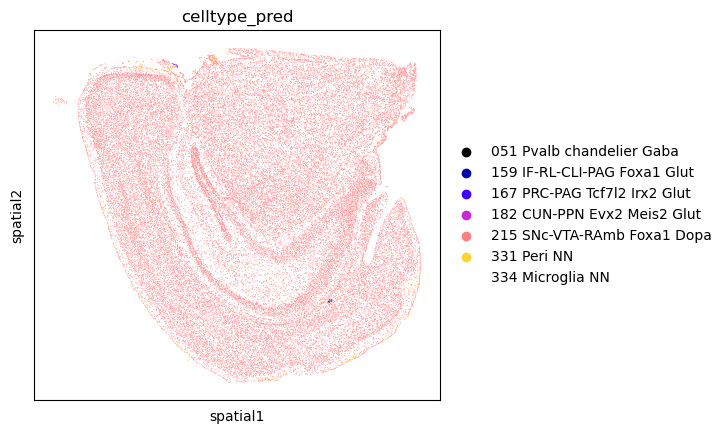

In [28]:

#spatial_adata = sc.read('../spatial/A5.h5ad')
params = {
    # 'pca_dim': 100,  
    'pca_dim': 150,  
    'k_graph': 20,
    'edge_weight': True,
    'kd_T': 3,
    'feat_dim': 1000,
    'w_dae': 30.0,
    # 'w_dae': 10.0,
    'w_gae': 5.0,
    # 'w_cls': 50.0,
    'w_cls': 5.0,
    'epochs': 20,
    # 'lr': 0.0005,
    'lr': 0.001
}

transfer(adata, 
         model = '/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/our_backup/mouse_model_11.dnnmodel', 
         transfer_batchsize = 4096, 
         result_csv = '/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/our_backup/spsc_transfer_backup_echo100.csv', 
         new_adata ='/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/our_backup/C12L_sptrans.h5ad', 
         device = 'cpu',
         k_graph = 20,
         params = params)

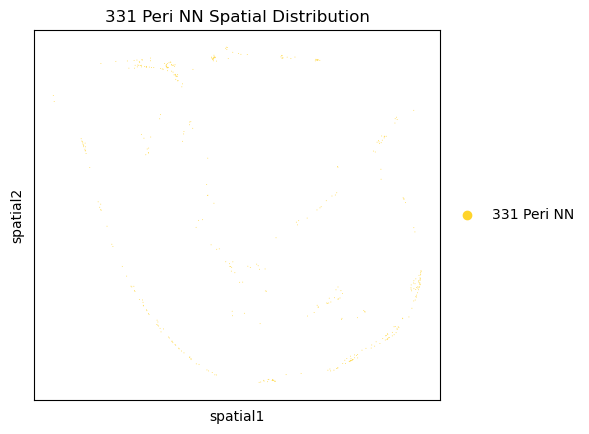

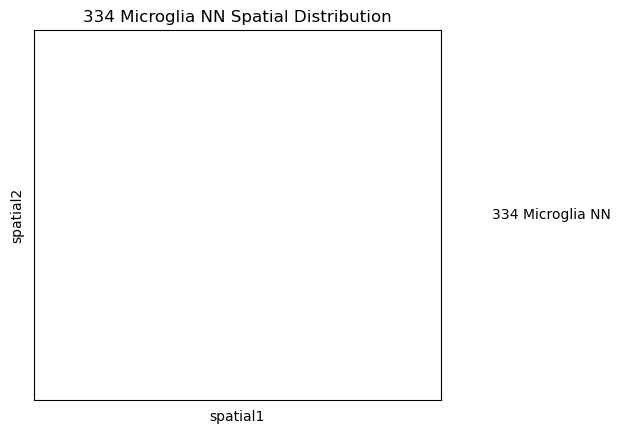

In [ ]:
celltypes = adata.obs['celltype_pred'].unique()

# 循环绘制每种细胞类型
for celltype in celltypes:
    # 创建该细胞类型的子集
    subset = adata[adata.obs['celltype_pred'] == celltype].copy()
    
    # 绘制该细胞类型的空间分布
    sc.pl.spatial(
        subset,
        color='celltype_pred',
        spot_size=30,
        title=f'{celltype} Spatial Distribution'
    )

In [49]:
adata

AnnData object with n_obs × n_vars = 55077 × 20145
    obs: 'x', 'y', 'total_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes', 'leiden'
    var: 'n_cells_by_counts', 'total_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

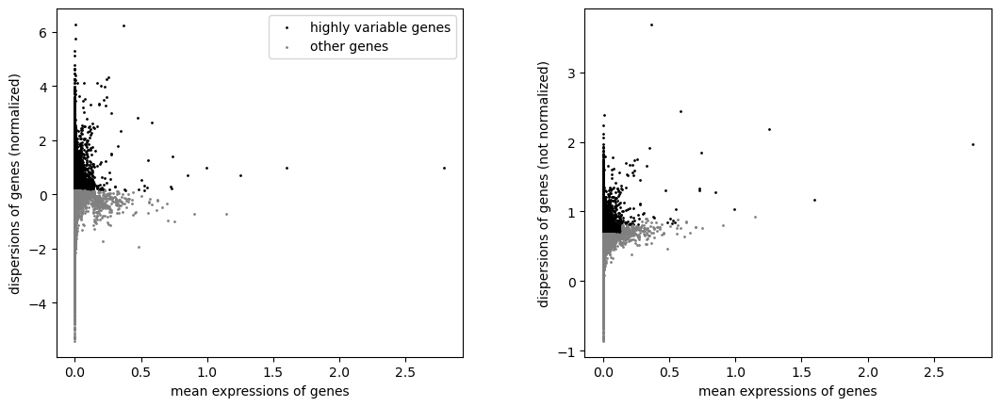

/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


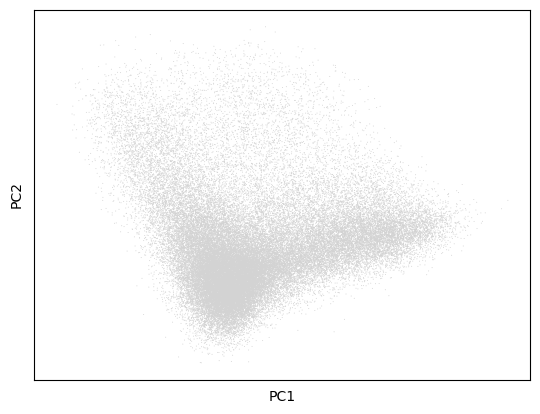

In [57]:
adata = sc.read('C12L/C03542C6.cellbin.h5ad')
adata
# Saving count data
adata.layers["counts"] = adata.X.copy()
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=10000)
sc.pl.highly_variable_genes(adata)
sc.tl.pca(adata)
sc.pl.pca(
    adata,
    ncols=2,
    size=2,
)
sc.pp.neighbors(adata, n_neighbors=30)

/cluster/home/liuhengxin/software/miniconda3_2/envs/spatialid/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


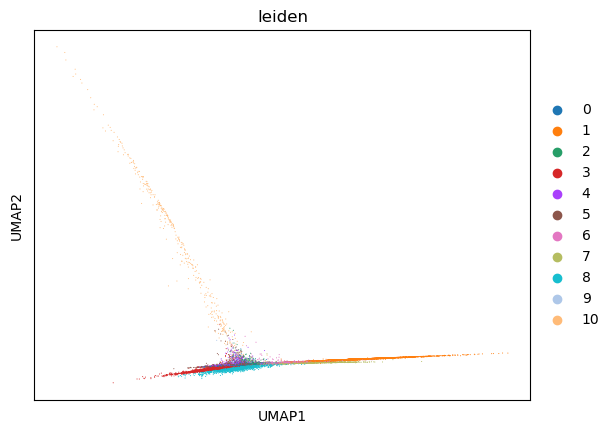

In [65]:
sc.tl.umap(adata, min_dist=0.8, spread=2.0)
# Using the igraph implementation and a fixed number of iterations can be significantly faster,
# especially for larger datasets
sc.tl.leiden(adata, n_iterations=10)
sc.pl.umap(adata, color=["leiden"])